> (Última Actualización: 29 de Octubre de 2025)

# **Introducción al modelado continuo** (*a.k.a.* **Ecuaciones de la física matemática**)
## Laboratorio numérico

Bienvenidos al laboratorio numérico de la materia *Introducción al modelado continuo*, también conocida como *Ecuaciones de la física matemática*. En este, vamos a ver métodos numéricos para resolver distintos tipos de problemas de manera general, y su relación y aplicación a problemas específicos de la materia, de manera tal de complementar los contenidos de la cursada teórico-práctica.

# Motivación de este colab
<!-- $$\require{amsmath}$$ -->

En el estudio numérico de la fenomenología de un sistema, tanto en la física como en cualquier área, la transformada de Fourier ocupa un lugar central. Permite pasar de una descripción temporal o espacial a una descripción en frecuencias, donde muchas ecuaciones y señales se vuelven más simples de analizar. En esta clase nos enfocaremos en **aplicaciones prácticas de la transformada de Fourier** y de su implementación computacional, la FFT. Veremos cómo una herramienta desarrollada originalmente para resolver ecuaciones diferenciales y estudiar ondas resulta igual de útil para analizar y procesar datos empíricos. Dado el carácter de la transformada de Fourier de extraer información de la periodicidad de la variable estudiada, esta técnica es especialmente **útil para datos estructurados**, ya sea en el tiempo o el espacio, es decir **series temporales e imágenes** (campos 2D).

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp

# Retina for matplotlib
%config InlineBackend.figure_format = 'retina'

In [2]:
from IPython.display import Audio

---
# Análisis de series temporales

Vamos a ver una de las aplicaciones más comunes de la FFT que es la de estudiar la composición espectral de una serie temporal como dato, es decir, cuáles son las frecuencias que están presentes en las cuáles se puede descomponer dicha variable discreta y acotada.

Recordemos algunas propiedades a tener en cuenta:
* En Python, `numpy` proporciona `np.fft.fft` para calcular la FFT de manera rápida y sencilla.
* Al usar esta función para transformar una señal a su representación en frecuencia, obtendremos valores complejos representando la magnitud y fase de cada frecuencia de la señal. Para representar la amplitud de las frecuencias, usamos el módulo de los valores complejos devueltos por la FFT.
* Es importante que la **frecuencia de muestreo** (fs) sea al menos el doble de la frecuencia máxima de la señal para cumplir con el teorema de Nyquist. Si la frecuencia de muestreo es insuficiente, se produce **aliasing**, y las componentes de frecuencia más altas se reflejan como componentes de frecuencia más bajas, distorsionando la señal.
* La FFT nos da tantos valores como puntos tenga la señal. Sin embargo, sólo la primera mitad de los valores representa frecuencias únicas (debido a la **simetría de la transformada**). Para interpretar la FFT, necesitamos generar un eje de frecuencias. Para visualizar correctamente, normalmente usamos sólo la primera mitad de los resultados, ya que en la FFT de una señal real, los valores de la segunda mitad son simétricos de los de la primera mitad.

**Ejemplo**

Como ejemplo, vamos a estudiar el espectro de señales de audio correspondientes a la escala de do mayor de un piano y de una guitarra.

In [ ]:
# audios_url = 'https://github.com/fcignoli/Tesis-de-Licenciatura/tree/main/Audios_crudos'
# piano_url = 'https://raw.githubusercontent.com/fcignoli/Tesis-de-Licenciatura/refs/heads/main/Audios_crudos/do_mayor_piano.wav'
# gtr_url = 'https://raw.githubusercontent.com/fcignoli/Tesis-de-Licenciatura/refs/heads/main/Audios_crudos/do_mayor_guitarra.wav'

In [3]:
!wget https://raw.githubusercontent.com/fcignoli/Tesis-de-Licenciatura/refs/heads/main/Audios_crudos/do_mayor_piano.wav

--2025-10-29 23:16:04--  https://raw.githubusercontent.com/fcignoli/Tesis-de-Licenciatura/refs/heads/main/Audios_crudos/do_mayor_piano.wav
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 635658 (621K) [audio/wav]
Saving to: ‘do_mayor_piano.wav’

do_mayor_piano.wav  100%[===================>] 620.76K  --.-KB/s    in 0.03s   

2025-10-29 23:16:04 (20.4 MB/s) - ‘do_mayor_piano.wav’ saved [635658/635658]



In [4]:
!wget https://raw.githubusercontent.com/fcignoli/Tesis-de-Licenciatura/refs/heads/main/Audios_crudos/do_mayor_guitarra.wav

--2025-10-29 23:16:05--  https://raw.githubusercontent.com/fcignoli/Tesis-de-Licenciatura/refs/heads/main/Audios_crudos/do_mayor_guitarra.wav
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 557100 (544K) [audio/wav]
Saving to: ‘do_mayor_guitarra.wav’

do_mayor_guitarra.w 100%[===================>] 544.04K  --.-KB/s    in 0.03s   

2025-10-29 23:16:06 (17.7 MB/s) - ‘do_mayor_guitarra.wav’ saved [557100/557100]



In [5]:
Audio("do_mayor_piano.wav")

In [6]:
Audio("do_mayor_guitarra.wav")

Nos quedamos con un fragmento al inicio que corresponde a la nota "do" aislada en cada audio, vemos el espectro con la fft, y comparamos. Pero para eso, primero cargamos los audios y los inspeccionamos, para tener una idea del segmento a extraer definido a ojo. También podríamos usar la herramienta `split_on_silence` del paquete `pydub`.



In [7]:
sr_piano, y_piano = sp.io.wavfile.read('do_mayor_piano.wav')
sr_gtr, y_gtr = sp.io.wavfile.read('do_mayor_guitarra.wav')

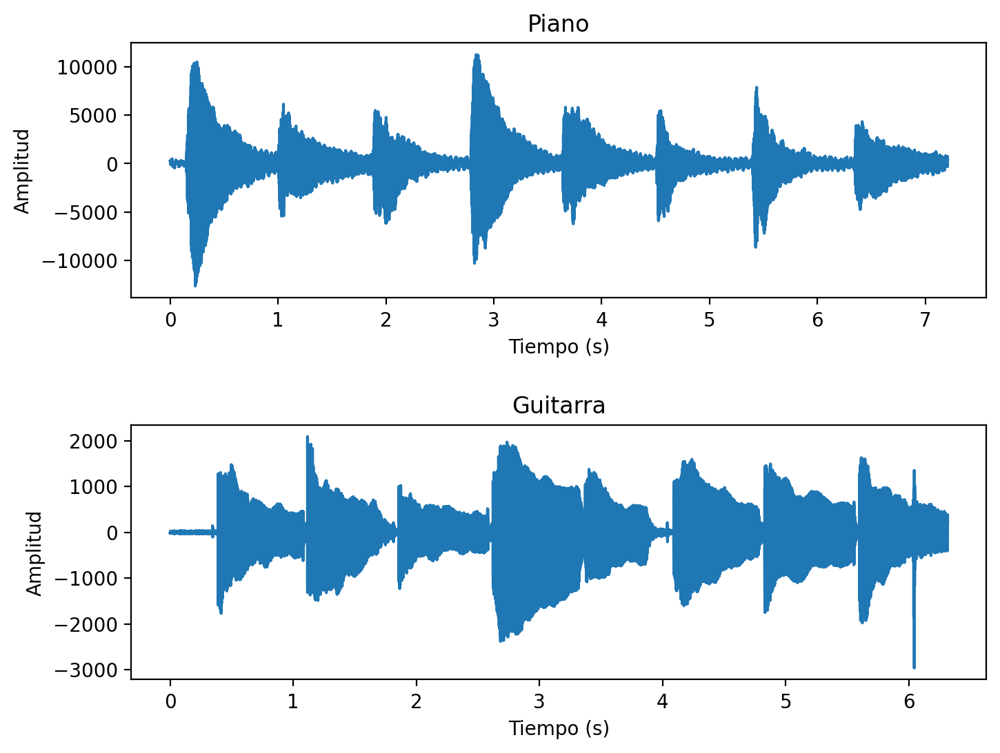

In [8]:
fig, axs = plt.subplots(2, 1, figsize=(8,6))
time_piano = np.arange(0, len(y_piano)/sr_piano, 1/sr_piano)
axs[0].plot(time_piano, y_piano)
axs[0].set_xlabel('Tiempo (s)')
axs[0].set_ylabel('Amplitud')
axs[0].set_title('Piano')

time_gtr = np.arange(0, len(y_gtr)/sr_gtr, 1/sr_gtr)
axs[1].plot(time_gtr, y_gtr)
axs[1].set_xlabel('Tiempo (s)')
axs[1].set_ylabel('Amplitud')
axs[1].set_title('Guitarra')

plt.subplots_adjust(hspace=0.5)
plt.show()

Probamos de definir los límites del 1er segmento, que es el que corresponde a la nota "do", graficando para chequear.

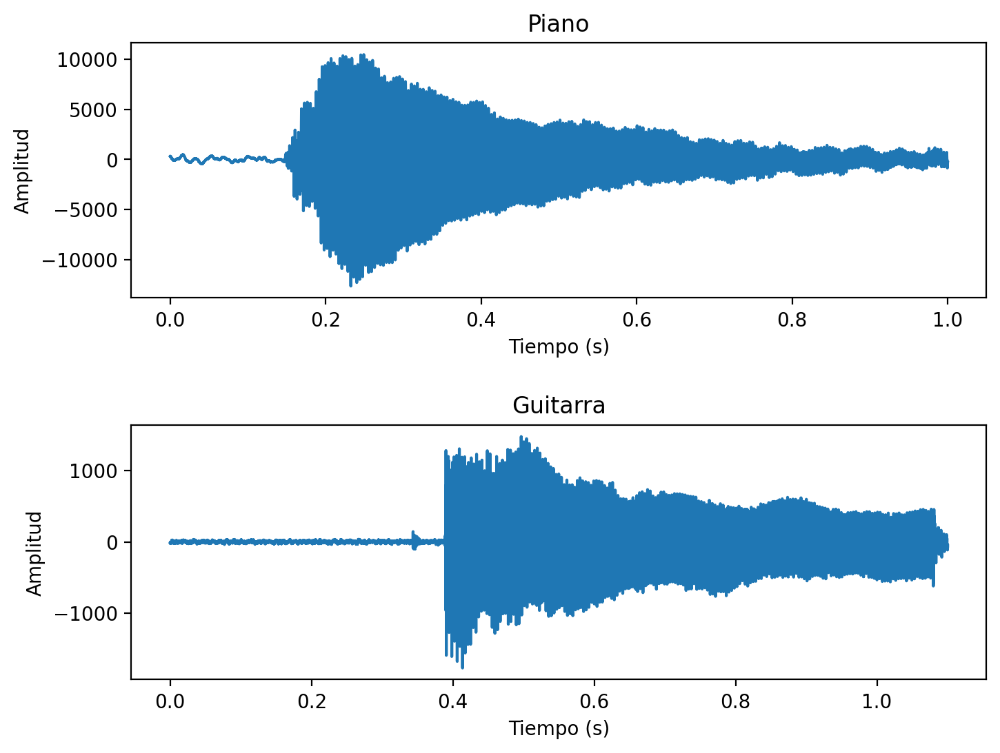

In [9]:
start_piano = 0
end_piano = int(1*sr_piano)
start_gtr = 0
end_gtr = int(1.1*sr_gtr)

fig, axs = plt.subplots(2, 1, figsize=(8,6))
time_piano = np.arange(0, len(y_piano)/sr_piano, 1/sr_piano)
axs[0].plot(time_piano[start_piano:end_piano], y_piano[start_piano:end_piano])
axs[0].set_xlabel('Tiempo (s)')
axs[0].set_ylabel('Amplitud')
axs[0].set_title('Piano')

time_gtr = np.arange(0, len(y_gtr)/sr_gtr, 1/sr_gtr)
axs[1].plot(time_gtr[start_gtr:end_gtr], y_gtr[start_gtr:end_gtr])
axs[1].set_xlabel('Tiempo (s)')
axs[1].set_ylabel('Amplitud')
axs[1].set_title('Guitarra')

plt.subplots_adjust(hspace=0.5)
plt.show()


In [10]:
# y_piano = y_piano[start_piano:end_piano]
# y_gtr = y_gtr[start_gtr:end_gtr]
sp.io.wavfile.write("piano_nota_do.wav", sr_piano, y_piano[start_piano:end_piano])
sp.io.wavfile.write("guitarra_nota_do.wav", sr_gtr, y_gtr[start_gtr:end_gtr])

In [11]:
Audio("piano_nota_do.wav")

In [12]:
Audio("guitarra_nota_do.wav")

Y ahora vemos los espectros usando la FFT

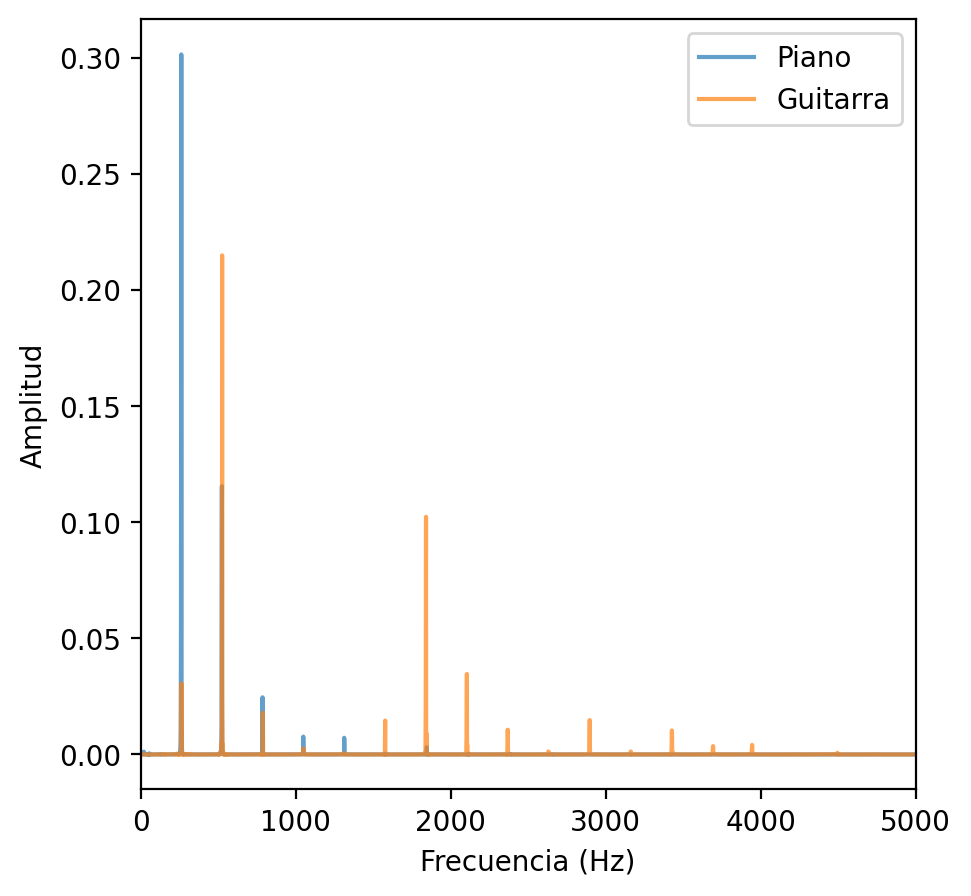

In [13]:
# Calculamos la transformado de Fourier de la señal de piano
fft_piano = np.abs(np.fft.rfft(y_piano[start_piano:end_piano]))
power_spectrum_piano = np.square(fft_piano)
# Normalizamos y quitamos el valor correspondiente al 0 de frecuencia (offset)
power_spectrum_piano = power_spectrum_piano[1:]
power_spectrum_piano = power_spectrum_piano/np.sum(power_spectrum_piano)
frequency_piano = np.linspace(0, 1/(2*1/sr_piano), len(power_spectrum_piano)+1)
frequency_piano = frequency_piano[1:]

# Calculamos la transformado de Fourier de la señal de guitarra
fft_gtr = np.abs(np.fft.rfft(y_gtr[start_gtr:end_gtr]))
power_spectrum_gtr = np.square(fft_gtr)
power_spectrum_gtr = power_spectrum_gtr[1:]
power_spectrum_gtr = power_spectrum_gtr/np.sum(power_spectrum_gtr)
frequency_gtr = np.linspace(0, 1/(2*1/sr_gtr), len(power_spectrum_gtr)+1)
frequency_gtr = frequency_gtr[1:]

alpha=0.7
plt.subplots(1, 1, figsize=(5,5))
plt.plot(frequency_piano, power_spectrum_piano, alpha=alpha, label='Piano')
plt.plot(frequency_gtr, power_spectrum_gtr, alpha=alpha, label='Guitarra')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Amplitud')
plt.xlim(0, 5000)
plt.legend()
plt.show()

Aquí vemos las componentes espectrales de la nota "do" central (C4), que tiene una frecuencia fundamental de aproximadamente 261.6 Hz, y sus armónicos son múltiplos enteros de esta frecuencia fundamental, siendo el segundo armónico aproximadamente 523.2 Hz (C5), el tercero ~784.8 Hz (G4) y así sucesivamente.

---
## Oscilador no-lineal forzado

En esta sección vamos a ver la dinámica compleja que puede generarse a partir de forzar periódicamente un oscilador no lineal. Vamos a trabajar con el oscilador de Duffing:

$$
\ddot{x}+\delta y + \alpha x + \beta x^{3} = \gamma cos(\omega t)
$$

con $\alpha=-1, \beta = 1, \delta=0.1, \gamma=0.35$

Vamos a escribir el oscilador como un sistema dinámico autónomo haciendo el reemplazo $\theta=\omega t$. Esto nos permitirá integrarlo fácilmente utilizando `solve_ivp`.

In [14]:
# Parámetros del oscilador:
alfa = -1
beta = 1
delta = 0.1
gamma = 0.35

def duffing(t, v):
    x, y, tita = v[0], v[1], v[2]
    dx = y
    dy = - delta * y - alfa * x - beta * x**3 + gamma * np.cos(tita)
    dtita = w
    return [dx, dy, dtita]

### Caso 1: siguiendo al forzante

Vamos a analizar un primer caso, donde el valor de frecuencia del forzante es $\omega = 1.6$.

In [15]:
# Caso 1:
w = 1.6

T = 2*np.pi / w
freq = 1/T
print('Frecuencia del forzante: ', freq, 'Hz')

# Integramos
dt = 0.1
N = 10000
t_eval = np.linspace(0, N * T, int(N * T / dt))
x0 = [1,1,0]
sol = sp.integrate.solve_ivp(duffing, [t_eval[0], t_eval[-1]], x0, t_eval=t_eval)
# tiempo = np.arange(0, 15000 * T, dt)
# x0 = [1,1,0]
# sol = sp.integrate.odeint(duffing, x0, tiempo)

# Quitamos el transitorio
transitorio = int(N*T/3)
x, y, tita = sol.y[0, transitorio:], sol.y[1, transitorio:], sol.y[2, transitorio:]
# x, y, tita = sol[transitorio:,0], sol[transitorio:,1], sol[transitorio:,2]
# Definimos el Forzante
forzante = np.cos(tita)


Frecuencia del forzante:  0.25464790894703254 Hz


Si observamos cómo lucen en el espacio de fases $x(t)$ y $\dot{x}(t)$, podemos notar que la solución del sistema se encuetra en un ciclo límite:

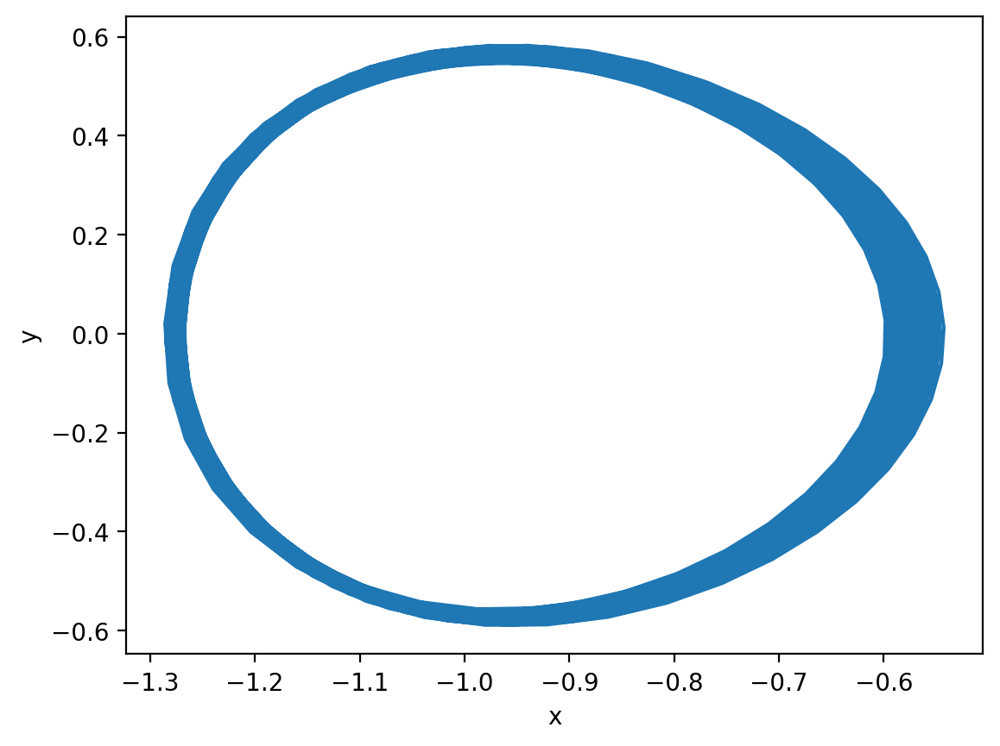

In [16]:
plt.plot(x,y)
plt.xlabel('x')
plt.ylabel('y')
plt.show()

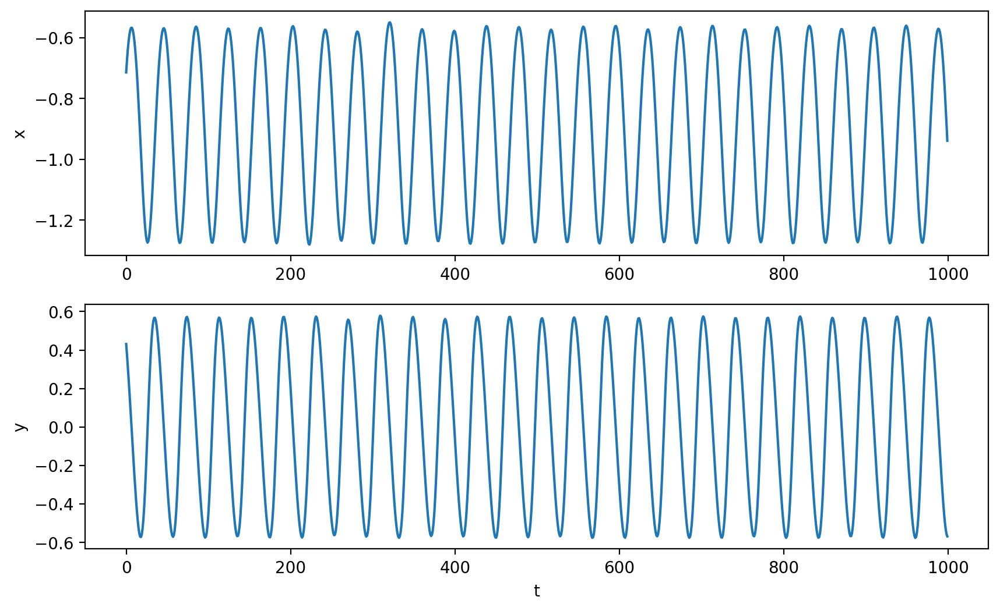

In [17]:
N = 1000
fig = plt.figure(figsize = (10,6))
plt.subplot(2,1,1)
plt.plot(x[0:N])
plt.ylabel('x')
# plt.xlabel('t')
plt.subplot(2,1,2)
plt.plot(y[0:N])
plt.ylabel('y')
plt.xlabel('t')
plt.show()

Analicemos el espectro de la señal $x(t)$. Para eso, utilizaremos la función para calcular la transformada rápida de fourier que trae la librería numpy: `np.fft.rfft()`, [acá la documentación](https://numpy.org/doc/stable/reference/generated/numpy.fft.rfft.html).

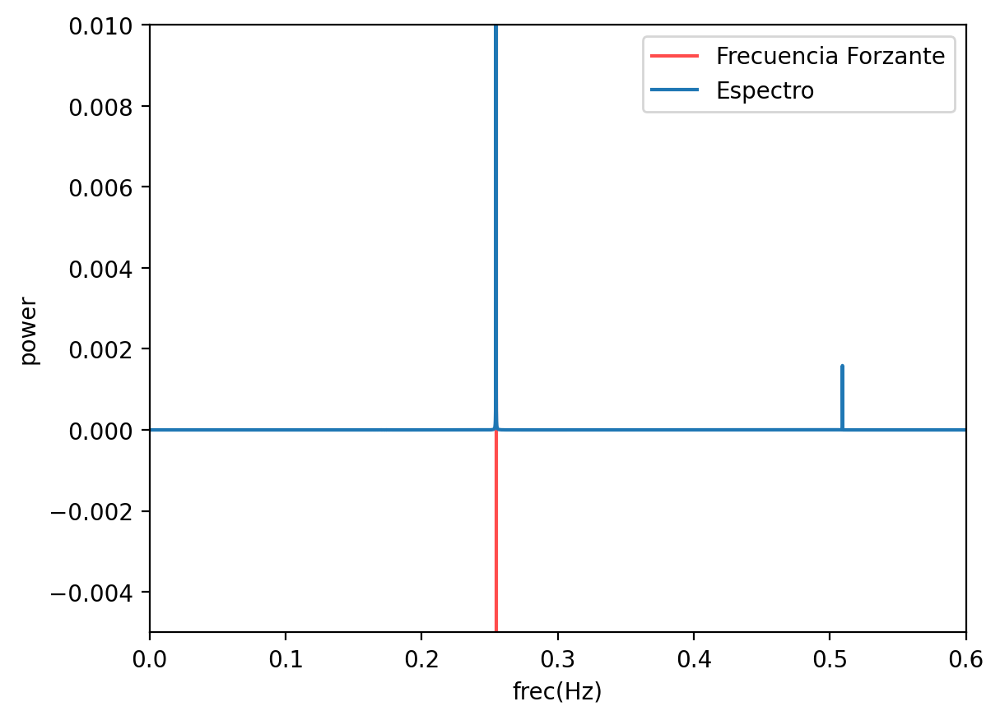

In [18]:
# Calculamos la transformado de Fourier de la señal
fourier_transform = np.fft.rfft(x)
abs_fourier_transform = np.abs(fourier_transform)
power_spectrum = np.square(abs_fourier_transform)

# Normalizamos y quitamos el valor correspondiente al 0 de frecuencia (offset)
power_spectrum = power_spectrum[1:]
power_spectrum = power_spectrum/np.sum(power_spectrum)
frequency = np.linspace(0, 1/(2*dt), len(power_spectrum)+1)
frequency = frequency[1:]

# Ploteamos el espectro y una linea vertical roja donde esta la frecuencia del Forzante
plt.axvline(x=freq,color='red',alpha=0.7, label='Frecuencia Forzante')
plt.plot(frequency, power_spectrum, label='Espectro')
plt.xlabel('frec(Hz)')
plt.ylabel('power')
plt.xlim(0,0.6)

# plt.ylim(-0.05,1)
plt.ylim(-0.005,0.01)
plt.legend()
plt.show()

Se puede observar fácilmente que la frecuencia predominante en la señal coincide con la del forzante. Al igual que en un oscilador lineal, en este caso el sistema sigue 1 a 1 la frecuencia del forzante.

**Observación:** En el eje y del gráfico, verán que también aparece una componente en la frecuencia correspondiente a 2 veces la frecuencia del forzante. Esto es lo que se llama un armónico de la frecuencia fundamental, aparecen en múltiplos enteros de la frecuencia fundamental. La proporción entre estos armónicos es lo que determina la forma de la señal periódica (si tengo únicamente un pico en la fundamental, estaríamos en el caso de una sinusoidal pura).

Si calculamos el máximo del espectro, veremos que coincide con la frecuencia del forzante:

In [19]:
maxi = frequency[np.argmax(power_spectrum)]
print('Frecuencia correspondiente al máximo =', maxi, 'Hz')

Frecuencia correspondiente al máximo = 0.2546560944126867 Hz


Finalmente, si graficamos en función del tiempo, podemos ver que el sistema se engancha (con alguna fase) a la frecuencia del forzante :

Text(0.5, 0, 'Tiempo')

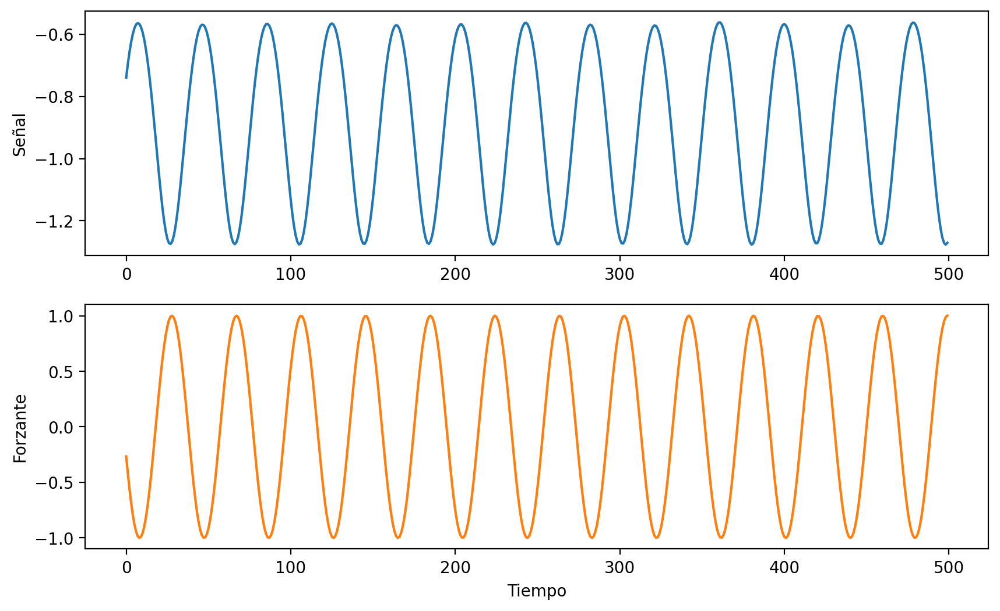

In [20]:
plt.figure(figsize=(10,6))
plt.subplot(211)
plt.plot(x[-500:], label='Señal', color='C0')
plt.ylabel('Señal')
plt.subplot(212)
plt.plot(forzante[-500:], label='Forzante', color='C1')
plt.ylabel('Forzante')
plt.xlabel('Tiempo')

En este caso tenemos un comportamiento muy similar al de un sistema lineal.

### Caso 2: subarmónicos

Volvamos a analizar el sistema de la misma forma que lo hicimos en el caso 1, pero esta vez con un valor de frecuencia del forzante $\omega = 1.35$:

In [ ]:
# Caso 2
w = 1.35

T = 2*np.pi / w
freq = 1/T
print('Frecuencia del forzante: ', freq, 'Hz')

# Integramos
dt = 0.1
N = 10000
t_eval = np.linspace(0, N * T, int(N * T / dt))
x0 = [1,1,0]
sol = sp.integrate.solve_ivp(duffing, [t_eval[0], t_eval[-1]], x0, t_eval=t_eval)

# Quitamos el transitorio
transitorio = int(N*T/3)
x, y, tita = sol.y[0, transitorio:], sol.y[1, transitorio:], sol.y[2, transitorio:]
# Definimos el Forzante
forzante = np.cos(tita)

Frecuencia del forzante:  0.21485917317405873 Hz


Si observamos el diagrama de fases, podemos notar que el sistema se encuentra en un ciclo límite.

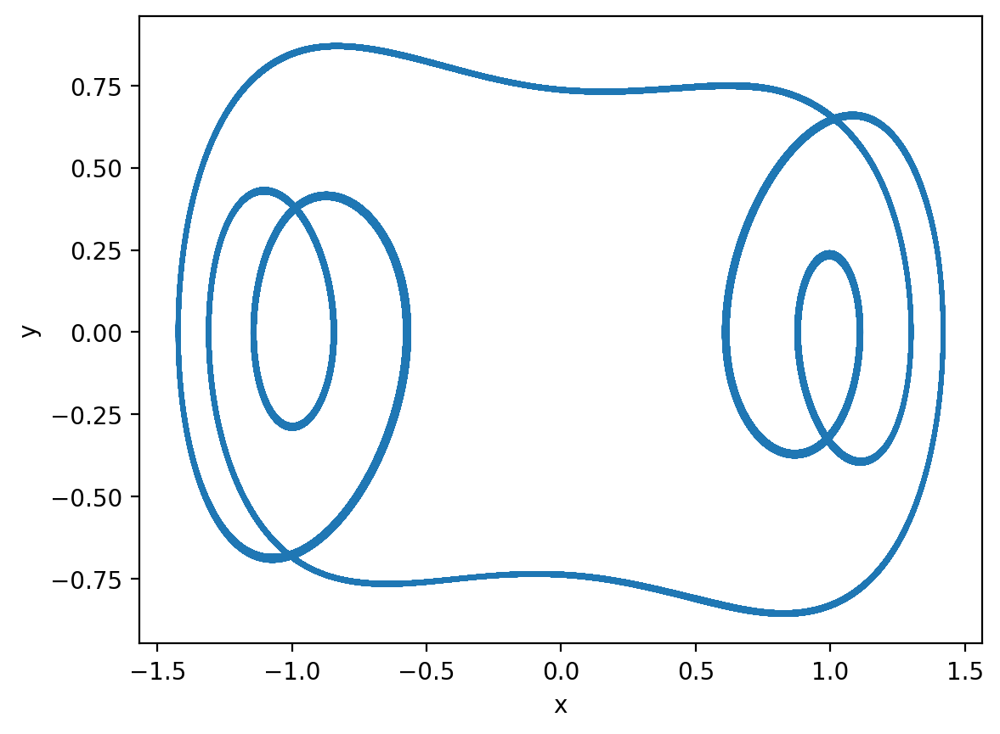

In [ ]:
plt.plot(x,y)
plt.xlabel('x')
plt.ylabel('y')
plt.show()

Recuerden que este es un sistema no autónomo, por lo tanto las "intersecciones" en este diagrama se dan a distintos tiempos. Si agregamos la dimension temporal:

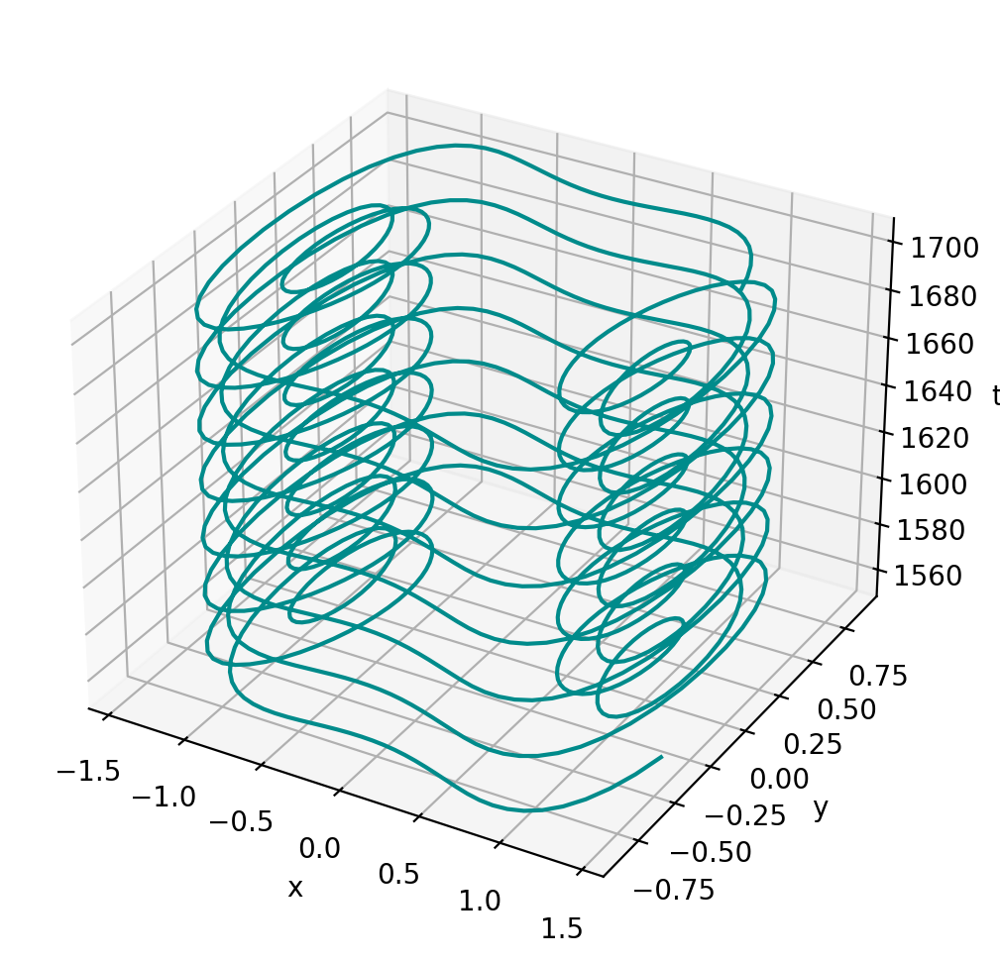

In [ ]:
fig = plt.figure(figsize=(6,6))
ax = plt.axes(projection="3d")
limit = int(transitorio/10)
ax.plot3D(x[0:limit], y[0:limit], tita[0:limit] / w, 'darkcyan')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('t')
plt.show()

Veamos el espectro de $x(t)$:

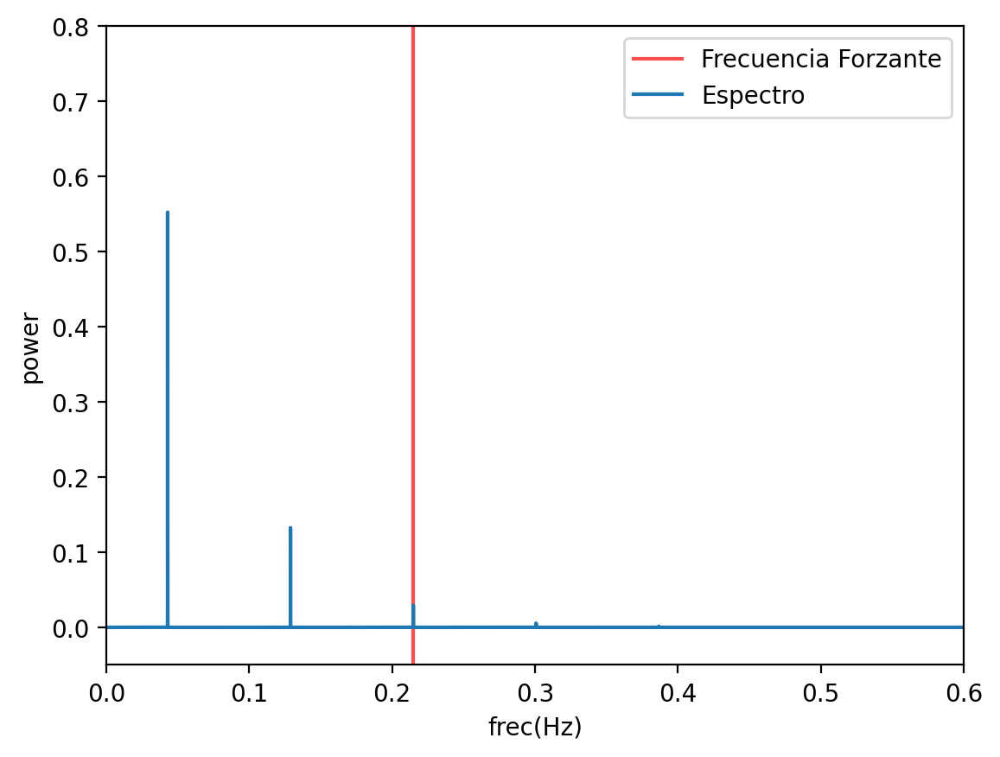

In [ ]:
# Calculamos la transformado de Fourier de la señal
fourier_transform = np.fft.rfft(x)
abs_fourier_transform = np.abs(fourier_transform)
power_spectrum = np.square(abs_fourier_transform)

# Normalizamos y quitamos el valor correspondiente al 0 de frecuencia (offset)
power_spectrum = power_spectrum[1:]
power_spectrum = power_spectrum/np.sum(power_spectrum)
frequency = np.linspace(0, 1/(2*dt), len(power_spectrum)+1)
frequency = frequency[1:]

# Ploteamos el espectro y una línea vertical roja donde esta la frecuencia del Forzante
plt.axvline(x=freq, color='red', alpha=0.7, label='Frecuencia Forzante')
plt.plot(frequency, power_spectrum, label='Espectro')
plt.xlabel('frec(Hz)')
plt.ylabel('power')
plt.xlim(0,0.6)

plt.ylim(-0.05,0.8)
plt.legend()
plt.show()

Esto es algo que no poríamos encontrar nunca en un sistema con dinámica lineal: **la respuesta del sistema tiene un periodo más grande que el forzante que lo está excitando.**

Estas frecuencias excitadas que se encuentran por debajo de la frecuencia del forzante se llaman subarmónicos. Es una diferencia fundamental entre la respuesta de los sistemas lineales y los no lineales (o, como decía [Stanislaw Ulam](https://www.nature.com/articles/432455a), de los "non-elephant animals").

Si calculamos la frecuencia del primer pico:

In [ ]:
maxi = frequency[np.argmax(power_spectrum)]
print('Frecuencia correspondiente al máximo =', maxi, 'Hz')

Frecuencia correspondiente al máximo = 0.04296453036856588 Hz


Podemos luego investigar su cociente con respecto a la frecuencia fundamental:

In [ ]:
print('Frec Forzante / Frec Sistema =', freq/maxi)

Frec Forzante / Frec Sistema = 5.000850034456702


Vemos que el sistema se está enganchando en una relación 5 a 1 con el forzante.

Podemos observar esta misma relación en el gráfico de $x(t)$ y el forzante en función del tiempo.

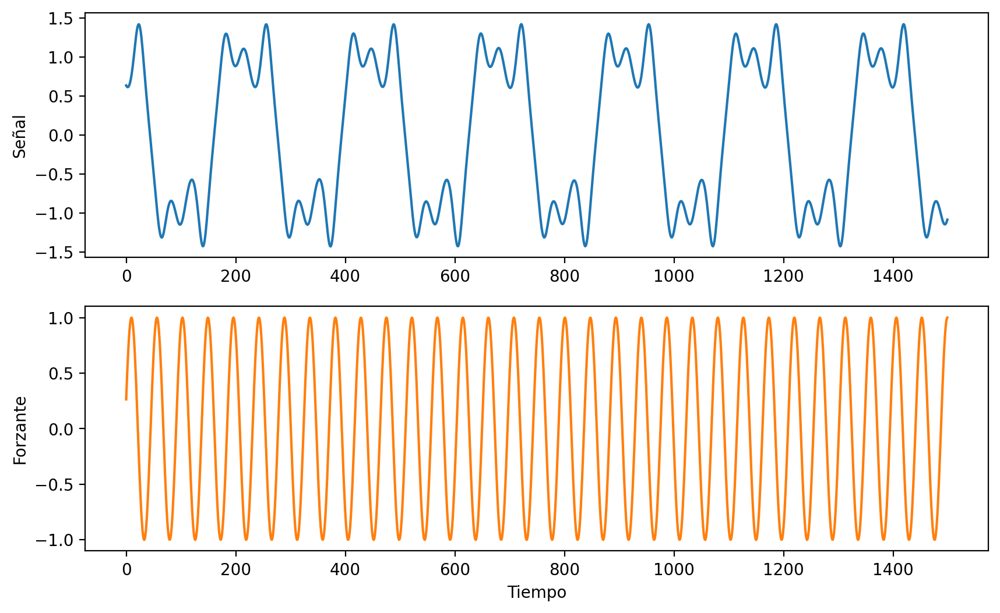

In [ ]:
plt.figure(figsize=(10,6))
plt.subplot(211)
plt.plot(x[-1500:], label='Señal', color='C0')
plt.ylabel('Señal')
plt.subplot(212)
plt.plot(forzante[-1500:], label='Forzante', color='C1')
plt.ylabel('Forzante')
plt.xlabel('Tiempo')
plt.show()

### Caso 3: caos

Volvamos a analizar el sistema de la misma forma que lo hicimos en el caso 1 y 2, pero esta vez con un valor de frecuencia del forzante $\omega = 1.4$:

In [ ]:
# Caso 3
w = 1.4

T = 2*np.pi / w
freq = 1/T
print('Frecuencia del forzante: ', freq, 'Hz')

# Integramos
dt = 0.1
t_eval = np.linspace(0, 15000 * T, int(15000 * T / dt))
x0 = [1,1,0]
sol = sp.integrate.solve_ivp(duffing, [t_eval[0], t_eval[-1]], x0, t_eval=t_eval)

# Quitamos el traClase 12:
Aplicaciones de la FFTnsitorio
transitorio = int(15000*T/3)
# transitorio = len(t_eval) // 3
x, y, tita = sol.y[0, transitorio:], sol.y[1, transitorio:], sol.y[2, transitorio:]
# Definimos el Forzante
forzante = np.cos(tita)

Frecuencia del forzante:  0.22281692032865347 Hz


Si observamos el diagrama de fases, podemos percibir que el sistema no parece estabilizarse en un ciclo límite.

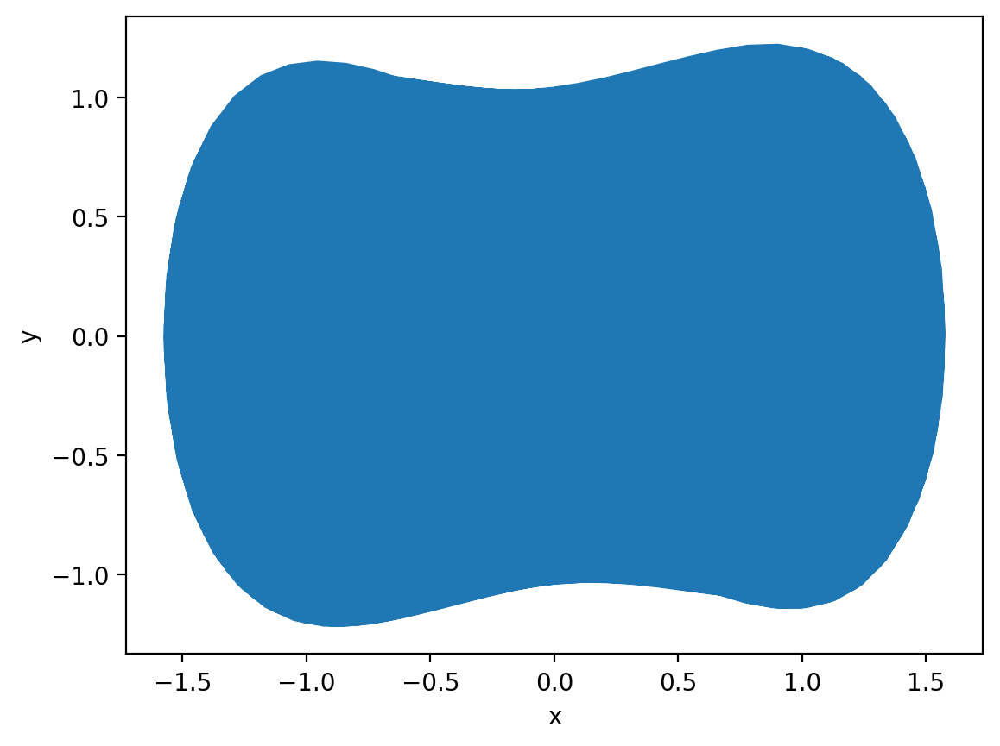

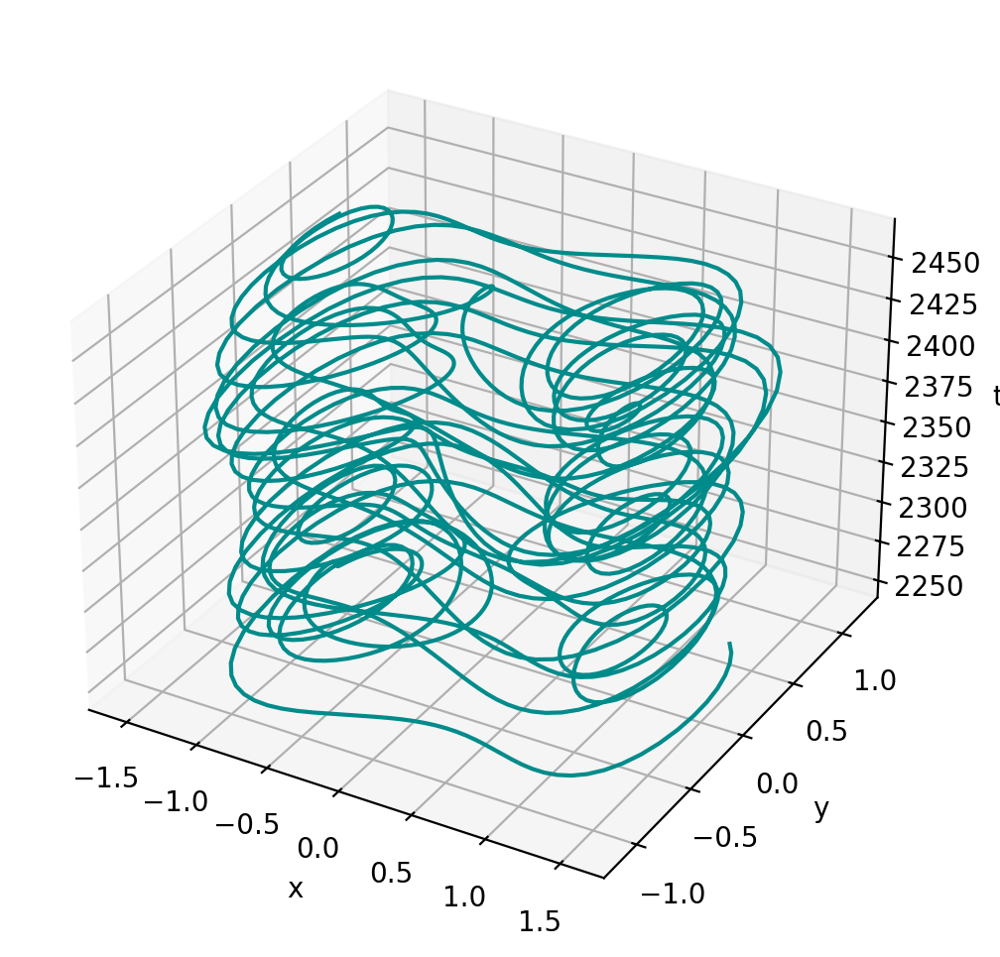

In [ ]:
plt.plot(x,y)
plt.xlabel('x')
plt.ylabel('y')
plt.show()

fig = plt.figure(figsize=(6,6))
ax = plt.axes(projection="3d")
limit = int(transitorio/10)
ax.plot3D(x[0:limit], y[0:limit], tita[0:limit] / w, 'darkcyan')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('t')
plt.show()

Como vieron en la teórica, esto es lo que llamamos una solución caótica del sistema y, a pesar de estar acotada en el espacio, no se acerca a un ciclo límite ni a un punto fijo.

En este caso la solución proyectada en $x(t)$ no será una señal periódica, pero igualmente podemos inspeccionar su espectro:

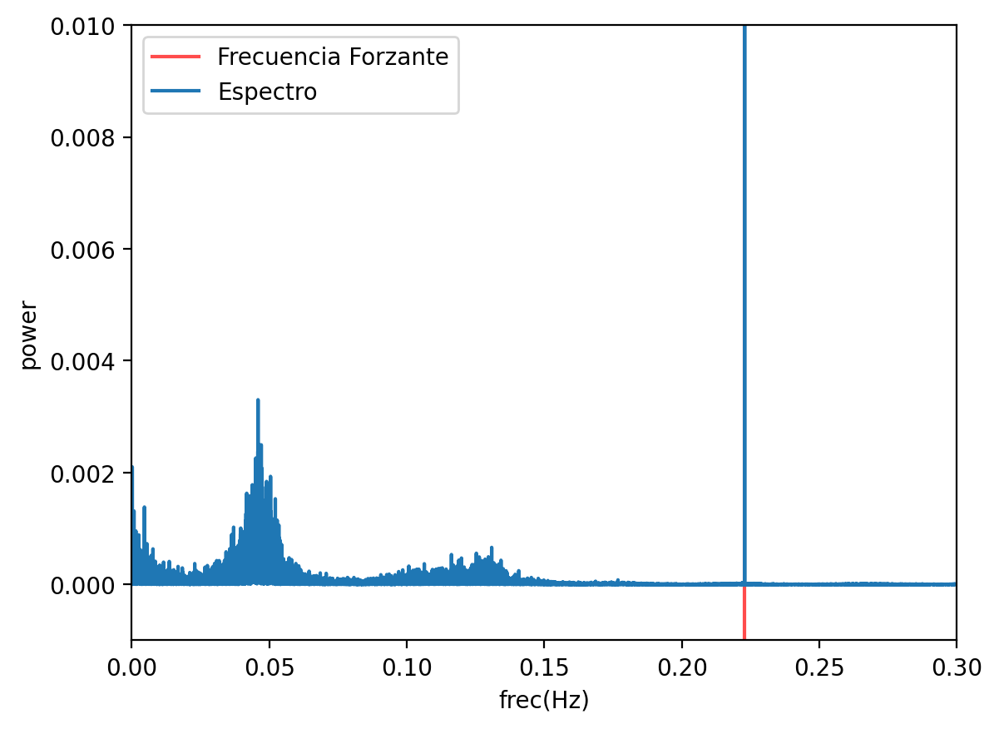

In [ ]:
# Calculamos la transformado de Fourier de la señal
fourier_transform = np.fft.rfft(x)
abs_fourier_transform = np.abs(fourier_transform)
power_spectrum = np.square(abs_fourier_transform)

# Normalizamos y quitamos el valor correspondiente al 0 de frecuencia (offset)
power_spectrum = power_spectrum[1:]
power_spectrum = power_spectrum/np.sum(power_spectrum)
frequency = np.linspace(0, 1/(2*dt), len(power_spectrum)+1)
frequency = frequency[1:]

# Ploteamos el espectro y una línea vertical roja donde esta la frecuencia del Forzante
plt.axvline(x=freq, color='red', alpha=0.7, label='Frecuencia Forzante')
plt.plot(frequency, power_spectrum, label='Espectro')
plt.xlabel('frec(Hz)')
plt.ylabel('power')
plt.xlim(0,0.3)

plt.ylim(-0.001,0.01)
plt.legend()
plt.show()

In [ ]:
maxi = frequency[np.argmax(power_spectrum)]
print('Frecuencia correspondiente al máximo =', maxi, 'Hz')

Frecuencia correspondiente al máximo = 0.22281708407733752 Hz


Como se puede observar, en este caso la señal es espectralmente compleja. El máximo del espectro coincide con la frecuencia del forzante, pero notemos que también aparecen frecuencias relevantes en $1/5$ y $3/5$ del forzante.

**Reflexionar:** Si pensamos en términos del espacio de fases ¿Qué significarán estos picos en $1/5$ y $3/5$? Noten que resulta sugerente el valor $1/5$ (ya había aparecido en la sección anterior).

Finalmente, podemos graficar la señal en función del tiempo y explicitar su aperiodicidad:

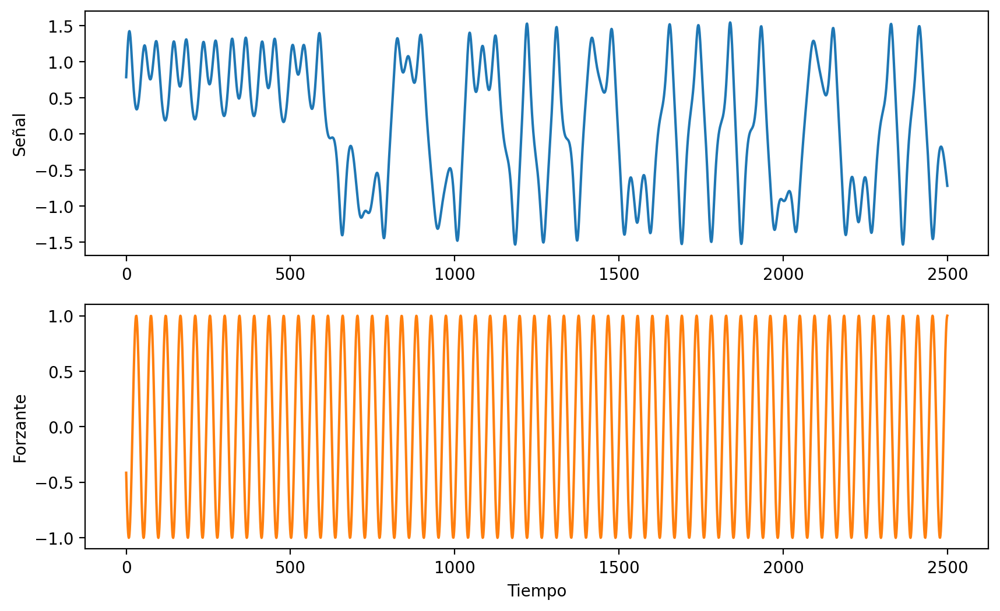

In [ ]:
plt.figure(figsize=(10,6))
plt.subplot(211)
plt.plot(x[-2500:], label='Señal', color='C0')
plt.ylabel('Señal')
plt.subplot(212)
plt.plot(forzante[-2500:], label='Forzante', color='C1')
plt.ylabel('Forzante')
plt.xlabel('Tiempo')
plt.show()

---
## Oscilador de Van der Pol

Sea el [oscilador de Van der Pol](https://en.wikipedia.org/wiki/Van_der_Pol_oscillator) a partir de la ecuación

$$
\ddot{x} - \mu(1 - x^2)\dot{x} + x = 0
$$


### Ejercicio 1

1.1. Escriba una función llamada `van_der_pol` para esta ecuación expresada como un sistema dinámico.

1.2. Integre con `solve_ivp` para los valores de $\mu$ iguales a 0.1, a 1, y a 10, con condiciones iniciales $x=1$ y $\dot{x}=0$, dandole suficiente tiempo a la solución según considere.

1.3. Compute la FFT de cada solución, y grafique los espectros.

1.4. Qué información me están dando sobre las soluciones? Para complementar el análisis, grafique la evolución de la variable $x$ en función del tiempo.


In [21]:
#1.1

def van_der_pol(t, v, mu):
    x, y = v[0], v[1]
    dx = y
    dy = mu*(1-x**2)*y - x
    return [dx, dy]

In [22]:
#1.2
mus = [0.1, 1, 10]

# Integramos
dt = 0.1
t_eval = np.linspace(0, 15000, int(15000/dt))
x0 = [1,0]
sol1 = sp.integrate.solve_ivp(van_der_pol, [t_eval[0], t_eval[-1]], x0, t_eval=t_eval, args = (mus[0],))
sol2 = sp.integrate.solve_ivp(van_der_pol, [t_eval[0], t_eval[-1]], x0, t_eval=t_eval, args = (mus[1],))
sol3 = sp.integrate.solve_ivp(van_der_pol, [t_eval[0], t_eval[-1]], x0, t_eval=t_eval, args = (mus[2],))

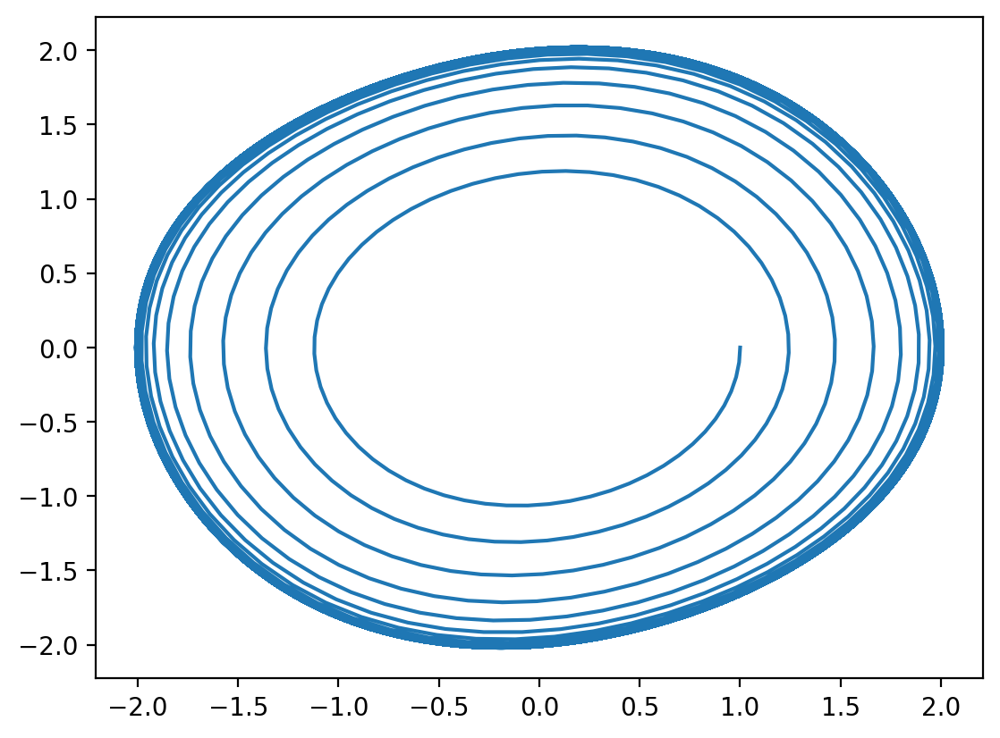

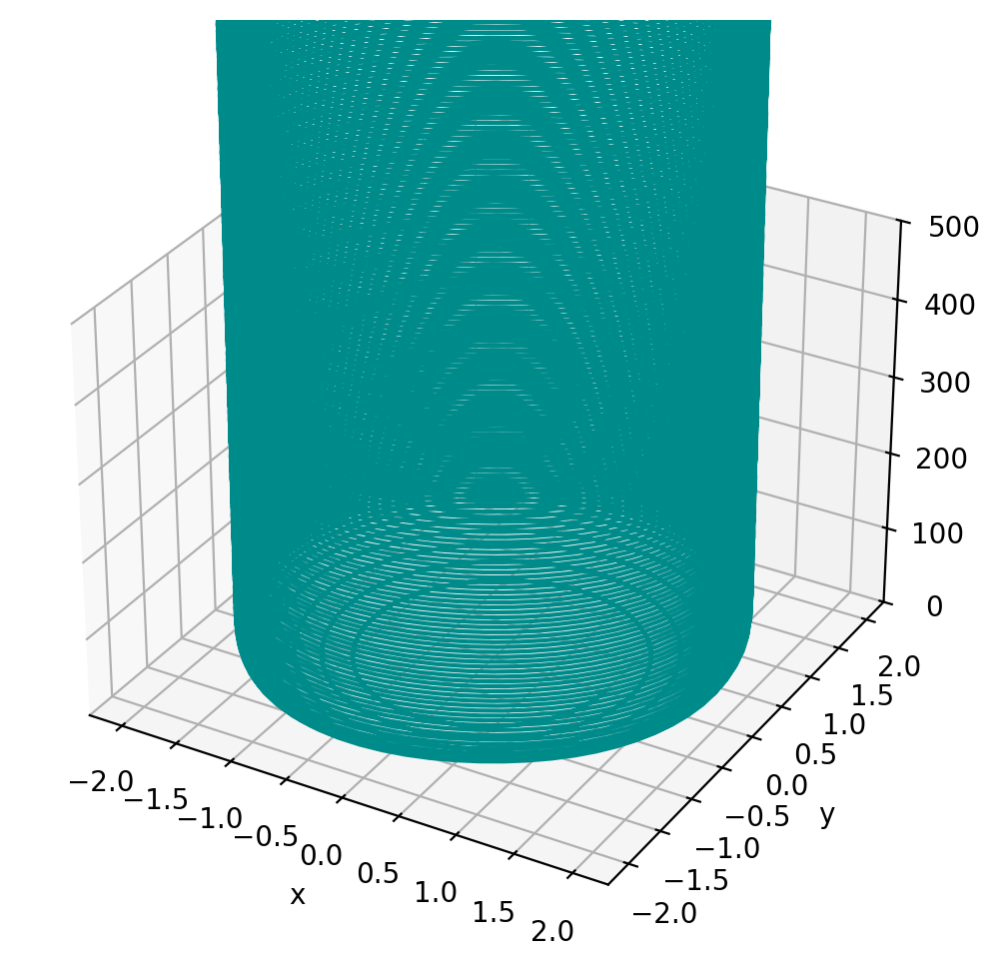

In [23]:
x, y = sol1.y[0], sol1.y[1]
plt.plot(x, y)
plt.show()

fig = plt.figure(figsize=(6,6))
ax = plt.axes(projection="3d")
limit = int(15000/10)
ax.plot3D(x, y, t_eval, 'darkcyan')
ax.set_zlim(0,500)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('t')
plt.show()

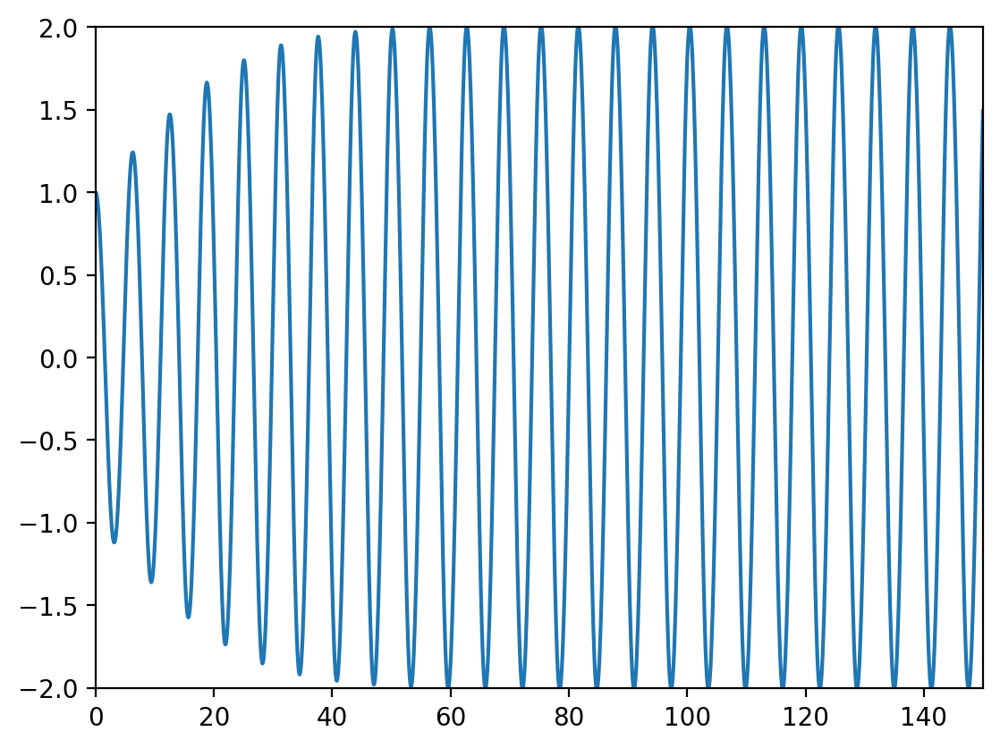

In [24]:
plt.plot(t_eval, x)
plt.xlim(0,150)
plt.ylim(-2,2)
plt.show()

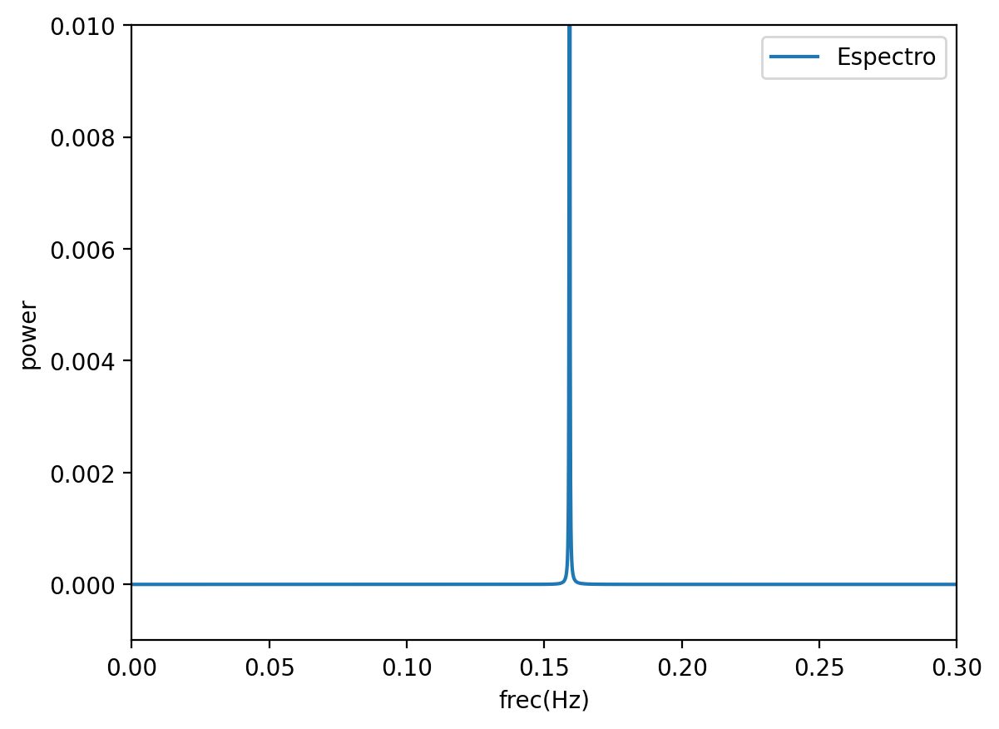

In [25]:
#1.3

#mu = 0.1


# Calculamos la transformado de Fourier de la señal
fourier_transform = np.fft.rfft(x)
abs_fourier_transform = np.abs(fourier_transform)
power_spectrum = np.square(abs_fourier_transform)

# Normalizamos y quitamos el valor correspondiente al 0 de frecuencia (offset)
power_spectrum = power_spectrum[1:]
power_spectrum = power_spectrum/np.sum(power_spectrum)
frequency = np.linspace(0, 1/(2*dt), len(power_spectrum)+1)
frequency = frequency[1:]

# Ploteamos el espectro y una línea vertical roja donde esta la frecuencia del Forzante
plt.plot(frequency, power_spectrum, label='Espectro')
plt.xlabel('frec(Hz)')
plt.ylabel('power')
plt.xlim(0,0.3)

plt.ylim(-0.001,0.01)
plt.legend()
plt.show()

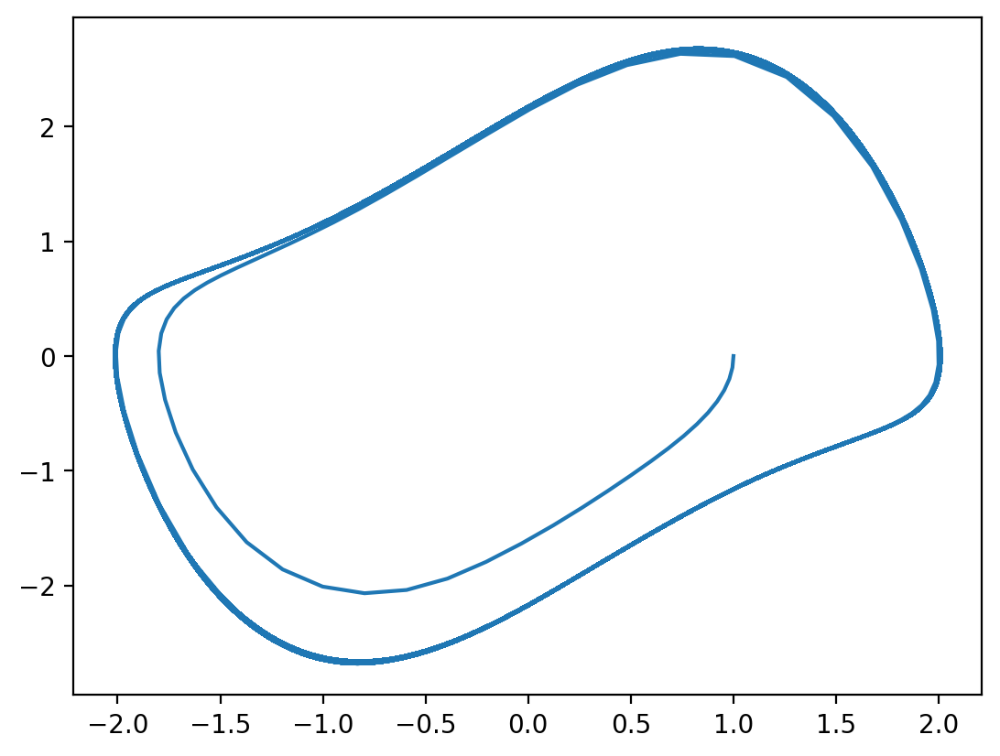

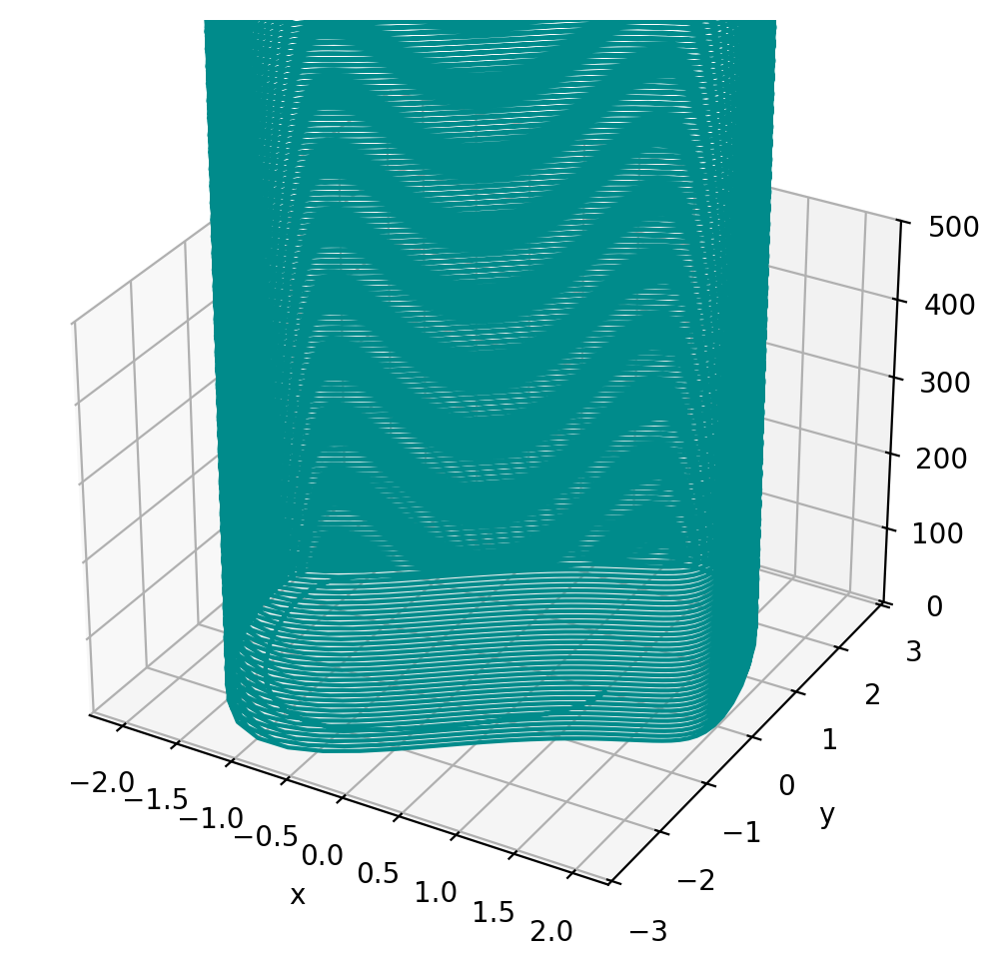

In [26]:
#mu = 1

x1, y1 = sol2.y[0], sol2.y[1]

plt.plot(x1, y1)
plt.show()

fig = plt.figure(figsize=(6,6))
ax = plt.axes(projection="3d")
limit = int(15000/10)
ax.plot3D(x1, y1, t_eval, 'darkcyan')
ax.set_zlim(0,500)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('t')
plt.show()

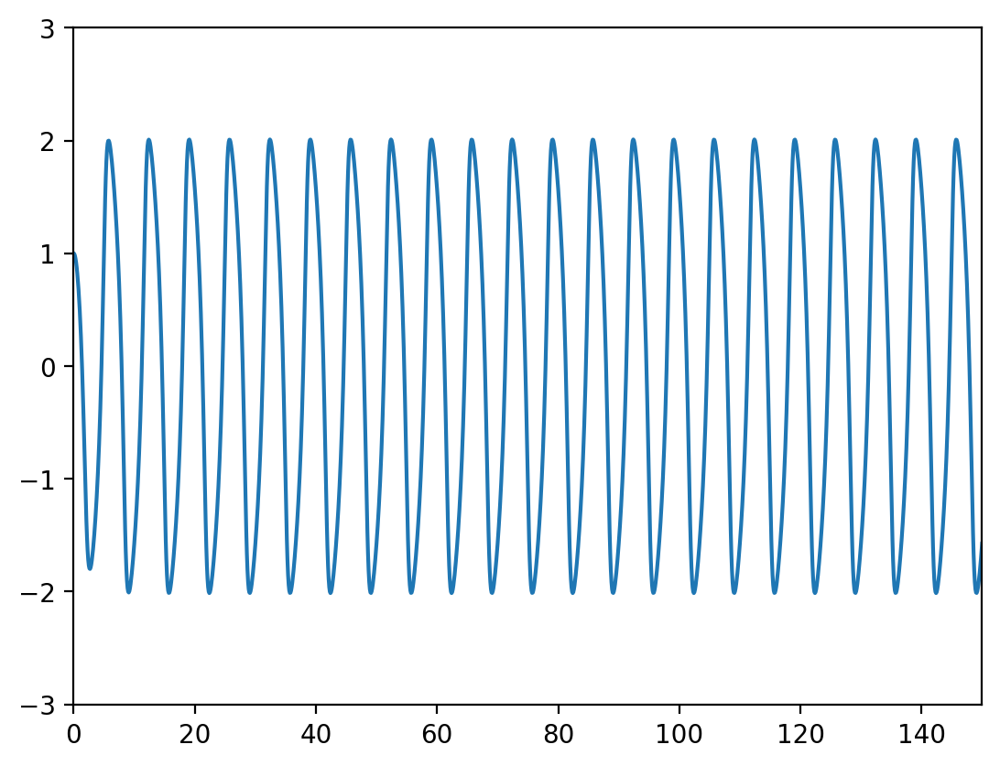

In [27]:
plt.plot(t_eval, x1)
plt.xlim(0,150)
plt.ylim(-3,3)
plt.show()

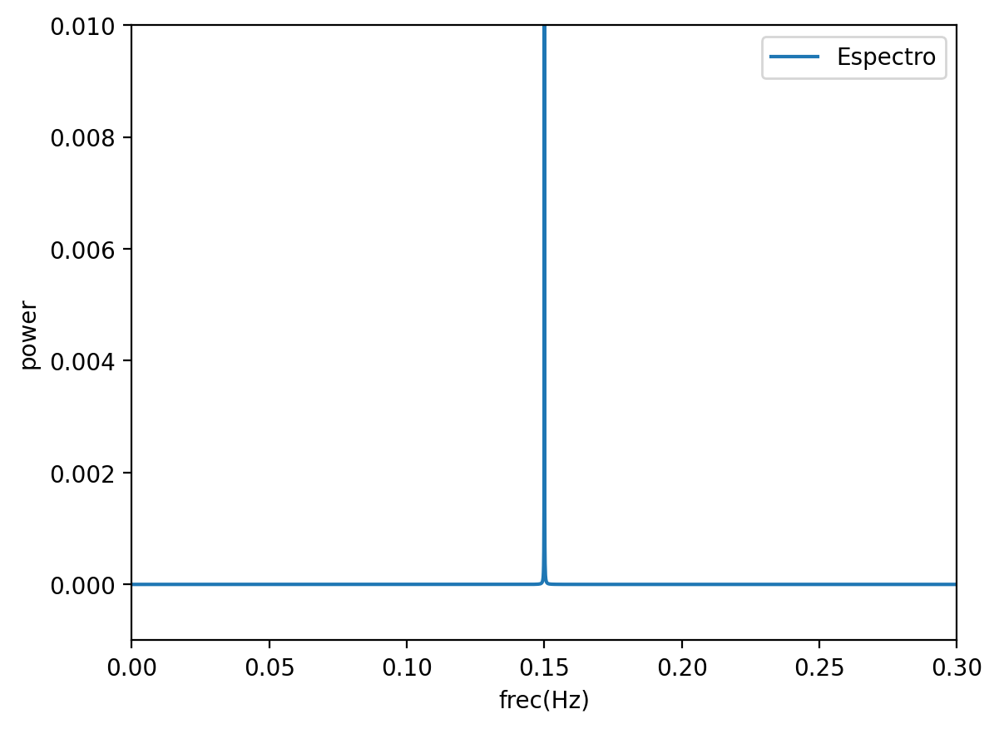

In [28]:


# Calculamos la transformado de Fourier de la señal
fourier_transform = np.fft.rfft(x1)
abs_fourier_transform = np.abs(fourier_transform)
power_spectrum = np.square(abs_fourier_transform)

# Normalizamos y quitamos el valor correspondiente al 0 de frecuencia (offset)
power_spectrum = power_spectrum[1:]
power_spectrum = power_spectrum/np.sum(power_spectrum)
frequency = np.linspace(0, 1/(2*dt), len(power_spectrum)+1)
frequency = frequency[1:]

# Ploteamos el espectro y una línea vertical roja donde esta la frecuencia del Forzante
plt.plot(frequency, power_spectrum, label='Espectro')
plt.xlabel('frec(Hz)')
plt.ylabel('power')
plt.xlim(0,0.3)

plt.ylim(-0.001,0.01)
plt.legend()
plt.show()

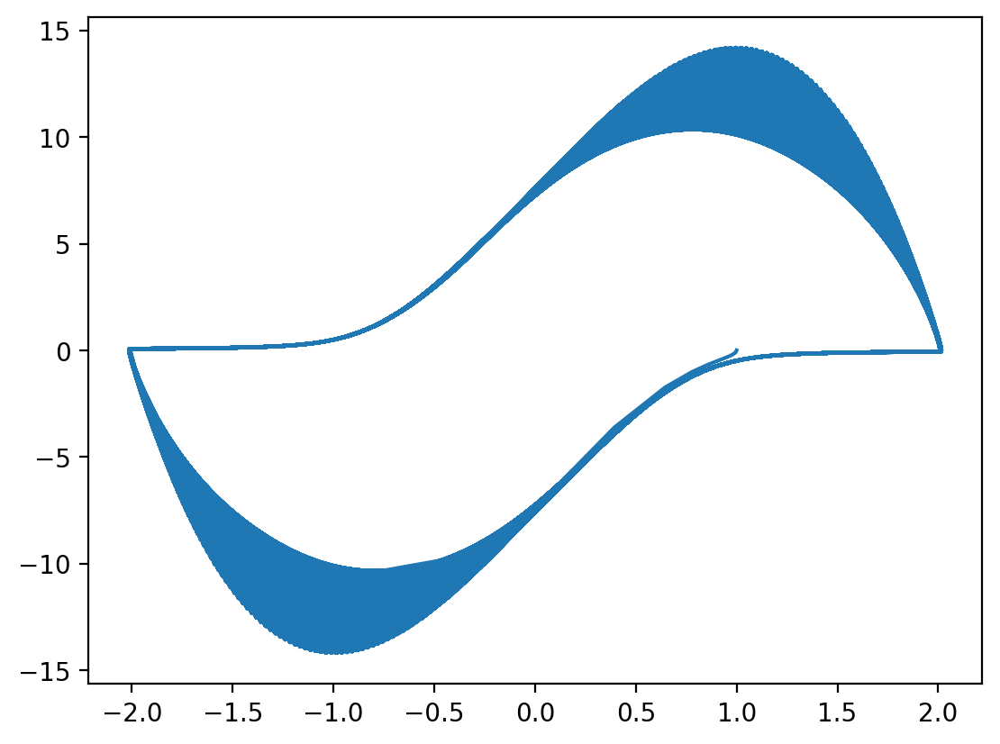

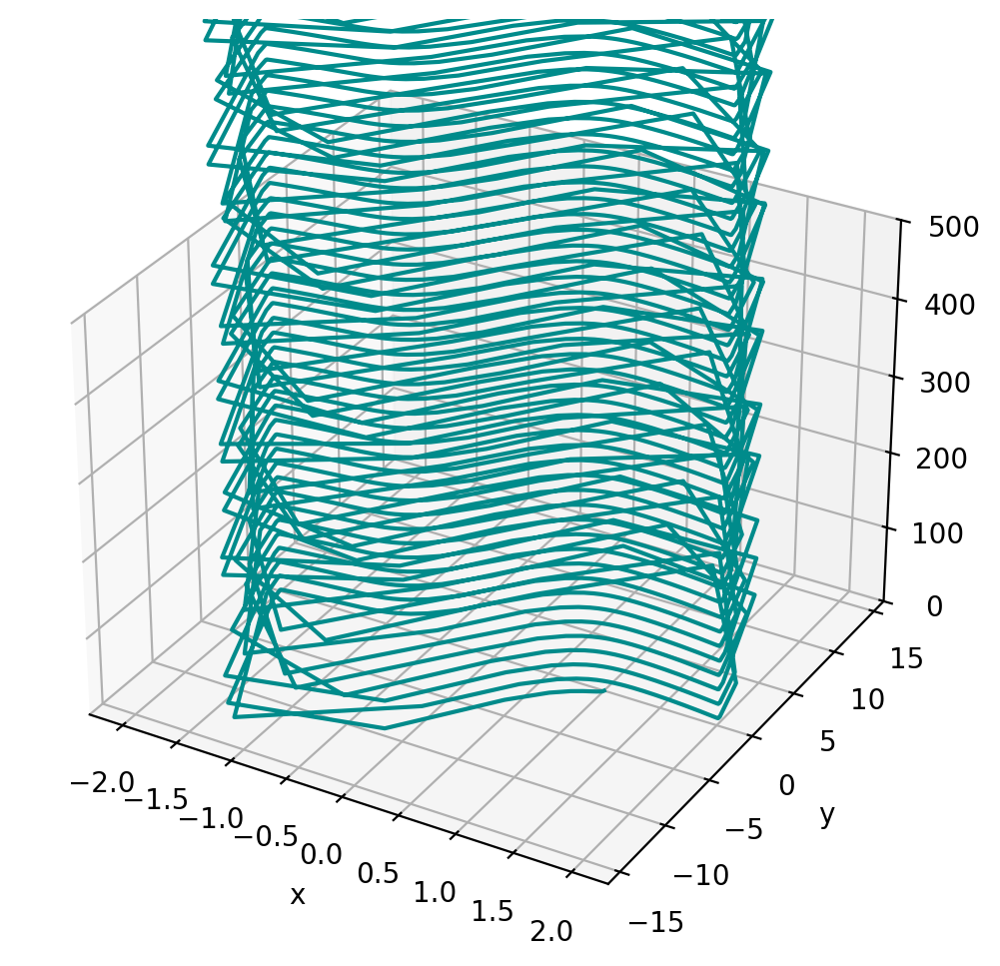

In [29]:
#mu = 10

x2, y2 = sol3.y[0], sol3.y[1]

plt.plot(x2, y2)
plt.show()

fig = plt.figure(figsize=(6,6))
ax = plt.axes(projection="3d")
limit = int(15000/10)
ax.plot3D(x2, y2, t_eval, 'darkcyan')
ax.set_zlim(0,500)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('t')
plt.show()

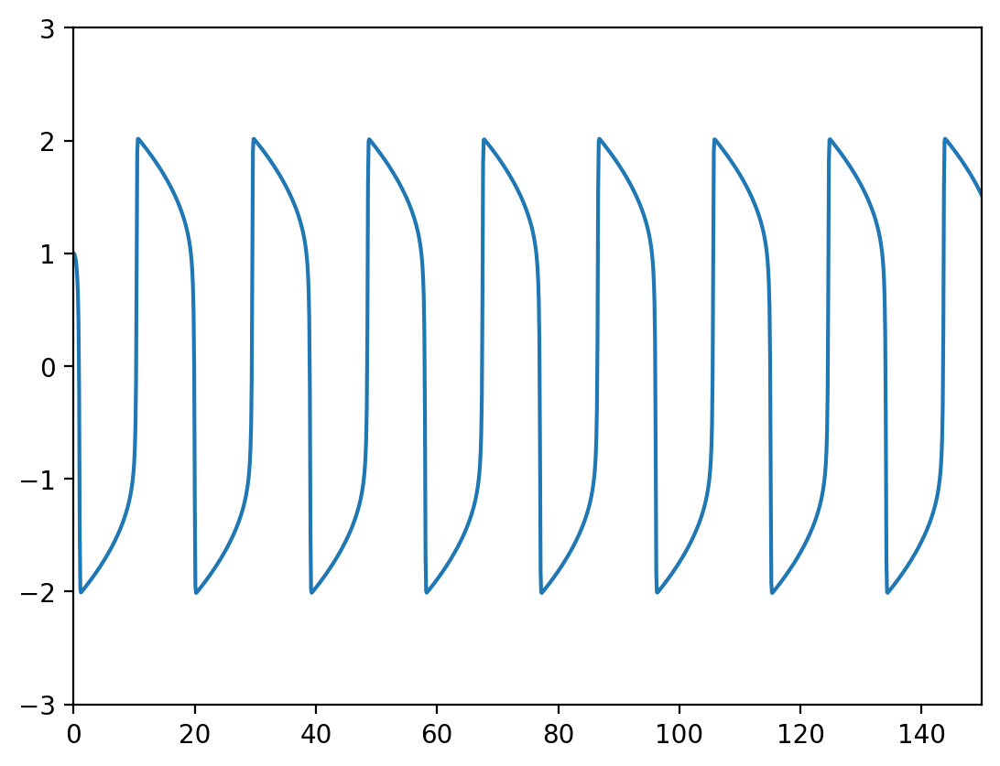

In [30]:
plt.plot(t_eval, x2)
plt.xlim(0,150)
plt.ylim(-3,3)
plt.show()

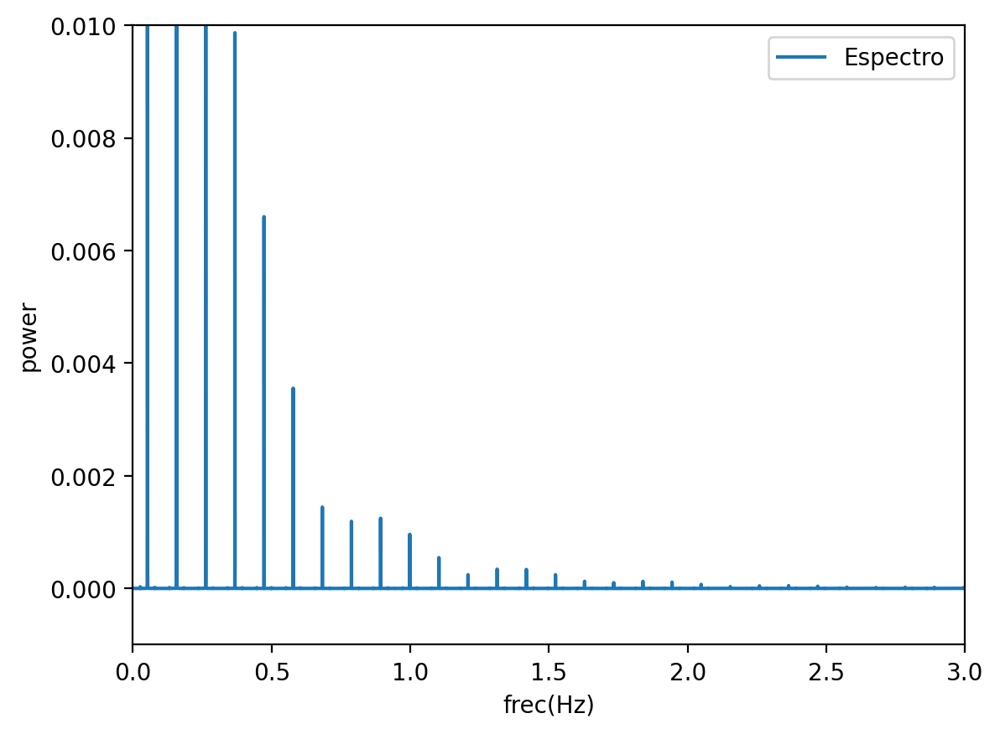

In [31]:
# Calculamos la transformado de Fourier de la señal
fourier_transform = np.fft.rfft(x2)
abs_fourier_transform = np.abs(fourier_transform)
power_spectrum = np.square(abs_fourier_transform)

# Normalizamos y quitamos el valor correspondiente al 0 de frecuencia (offset)
power_spectrum = power_spectrum[1:]
power_spectrum = power_spectrum/np.sum(power_spectrum)
frequency = np.linspace(0, 1/(2*dt), len(power_spectrum)+1)
frequency = frequency[1:]

# Ploteamos el espectro y una línea vertical roja donde esta la frecuencia del Forzante
plt.plot(frequency, power_spectrum, label='Espectro')
plt.xlabel('frec(Hz)')
plt.ylabel('power')
plt.xlim(0,3)

plt.ylim(-0.001,0.01)
plt.legend()
plt.show()

---
## Rossler

Sea el sistema de ecuaciones de Rossler

$$
\dot{x} = - y - z \\
\dot{y} = x + ay \\
\dot{z} = b + xz - cz
$$

donde $a, b, c > 0$ son parámetros.


### Ejercicio 2

2.1. Simular un sistema de Rossler igual al que usamos en la Notebook de atractores caóticos. Para esto, estudien 3 configuraciones posibles del parámetro $c: 2.3, 3.3, 6.3$ dejando fijos $a$ y $b$ en 0.2.

2.2. Analizar el espectro de fourier de la solución proyectada al eje $x$ para todos los casos. ¿A qué corresponden los picos que se observan?

2.3. Estudie la bifurcación de duplicación de periodo en el sistema de Rossler haciendo un barrido en el parámetro $c$ y usando como herramienta la FFT.

In [32]:
#2.1

def rossler(t, v, a, b, c):
    x, y, z = v[0], v[1], v[2]
    dx = -y -z
    dy = x + a*y
    dz = b + x*z - c*z
    return [dx, dy, dz]

a = 0.2
b = 0.2
cs = [2.3, 3.3, 6.3]

# Integramos
dt = 0.1
t_eval = np.linspace(0, 15000, int(15000/dt))
x0 = [1,1,1]
sol1 = sp.integrate.solve_ivp(rossler, [t_eval[0], t_eval[-1]], x0, t_eval=t_eval, args = (a, b, cs[0]))
sol2 = sp.integrate.solve_ivp(rossler, [t_eval[0], t_eval[-1]], x0, t_eval=t_eval, args = (a, b, cs[1]))
sol3 = sp.integrate.solve_ivp(rossler, [t_eval[0], t_eval[-1]], x0, t_eval=t_eval, args = (a, b, cs[2]))

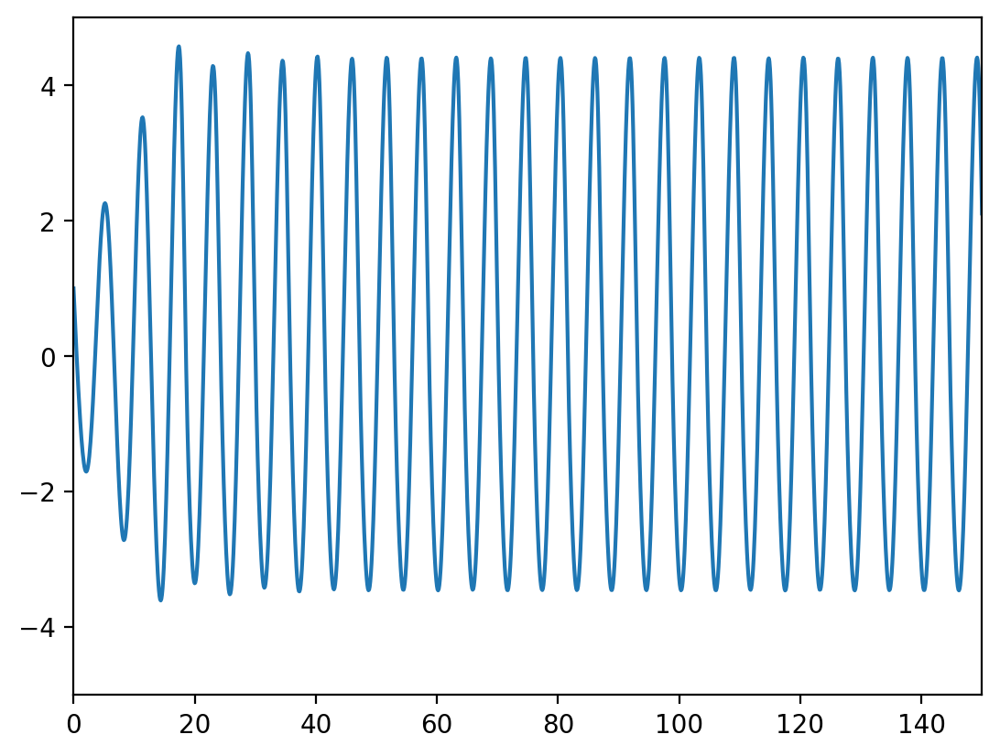

In [33]:
#c = 2.3
x1, y1, z1 = sol1.y[0], sol1.y[1], sol1.y[2]

plt.plot(t_eval, x1)
plt.xlim(0,150)
plt.ylim(-5,5)
plt.show()

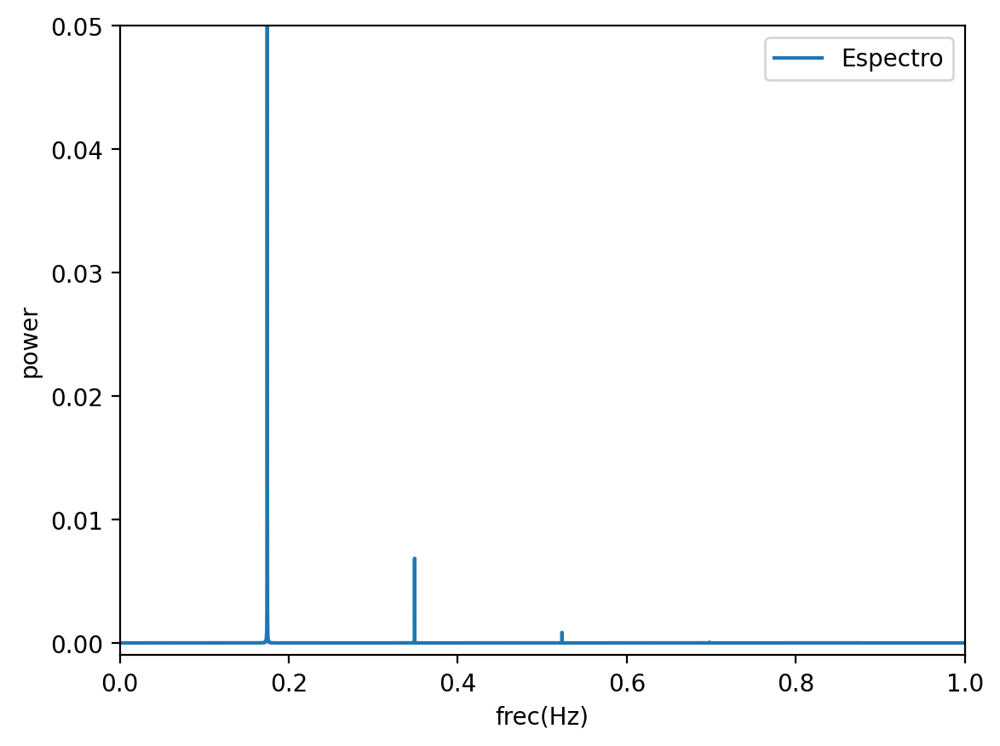

In [34]:
# Calculamos la transformado de Fourier de la señal
fourier_transform = np.fft.rfft(x1)
abs_fourier_transform = np.abs(fourier_transform)
power_spectrum = np.square(abs_fourier_transform)

# Normalizamos y quitamos el valor correspondiente al 0 de frecuencia (offset)
power_spectrum = power_spectrum[1:]
power_spectrum = power_spectrum/np.sum(power_spectrum)
frequency = np.linspace(0, 1/(2*dt), len(power_spectrum)+1)
frequency = frequency[1:]

# Ploteamos el espectro y una línea vertical roja donde esta la frecuencia del Forzante
plt.plot(frequency, power_spectrum, label='Espectro')
plt.xlabel('frec(Hz)')
plt.ylabel('power')
plt.xlim(0,1)

plt.ylim(-0.001,0.05)
plt.legend()
plt.show()

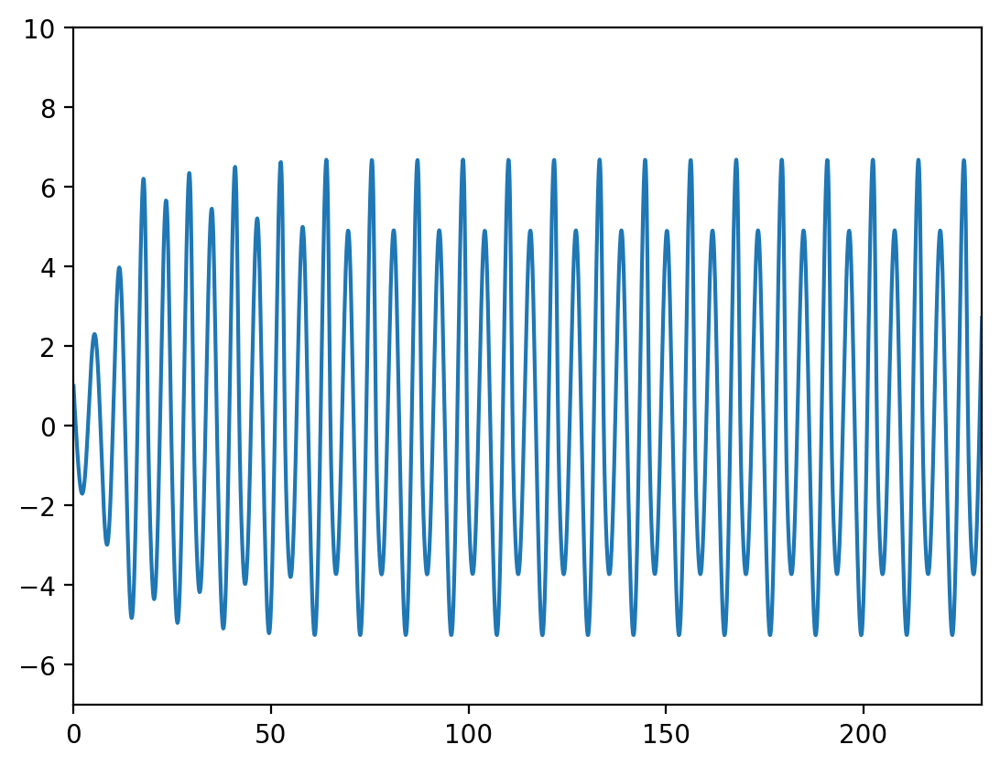

In [35]:
#c = 3.3
x2, y2, z2 = sol2.y[0], sol2.y[1], sol2.y[2]

plt.plot(t_eval, x2)
plt.xlim(0,230)
plt.ylim(-7,10)
plt.show()

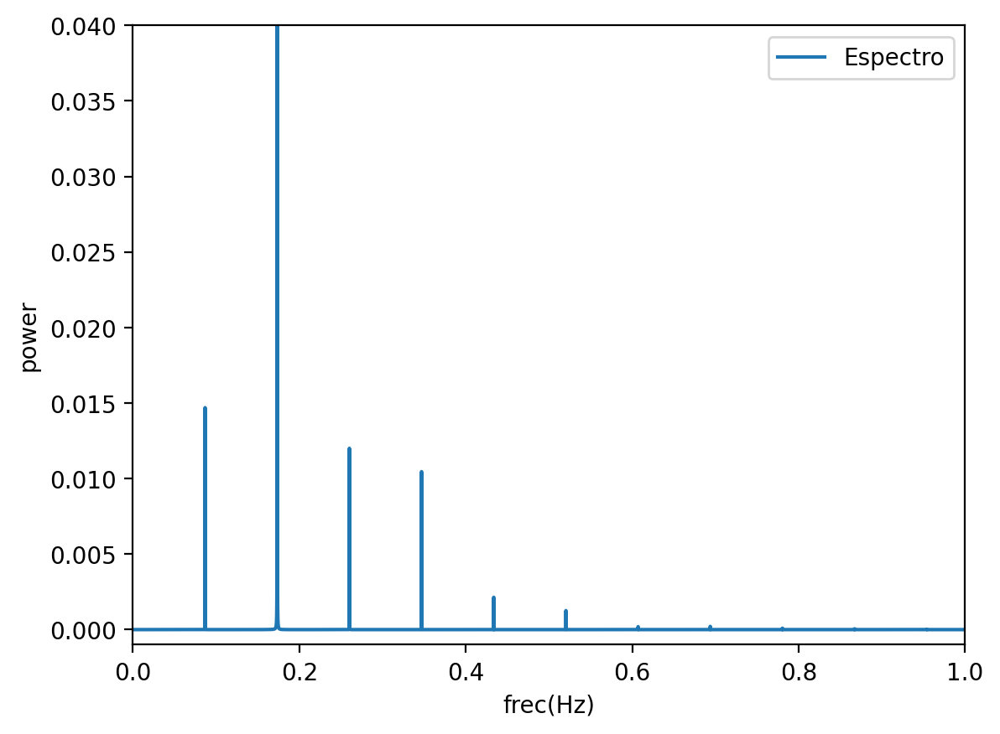

In [36]:
# Calculamos la transformado de Fourier de la señal
fourier_transform = np.fft.rfft(x2)
abs_fourier_transform = np.abs(fourier_transform)
power_spectrum = np.square(abs_fourier_transform)

# Normalizamos y quitamos el valor correspondiente al 0 de frecuencia (offset)
power_spectrum = power_spectrum[1:]
power_spectrum = power_spectrum/np.sum(power_spectrum)
frequency = np.linspace(0, 1/(2*dt), len(power_spectrum)+1)
frequency = frequency[1:]

# Ploteamos el espectro y una línea vertical roja donde esta la frecuencia del Forzante
plt.plot(frequency, power_spectrum, label='Espectro')
plt.xlabel('frec(Hz)')
plt.ylabel('power')
plt.xlim(0,1)

plt.ylim(-0.001,0.04)
plt.legend()
plt.show()

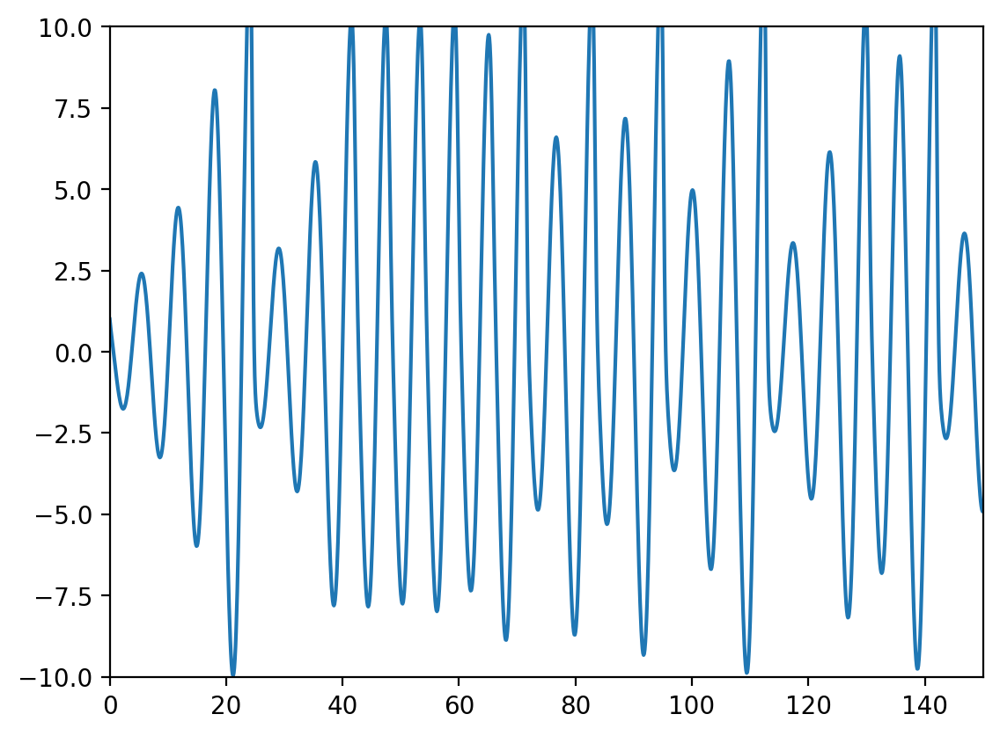

In [37]:
#c = 6.3
x3, y3, z3 = sol3.y[0], sol3.y[1], sol3.y[2]

plt.plot(t_eval, x3)
plt.xlim(0,150)
plt.ylim(-10,10)
plt.show()

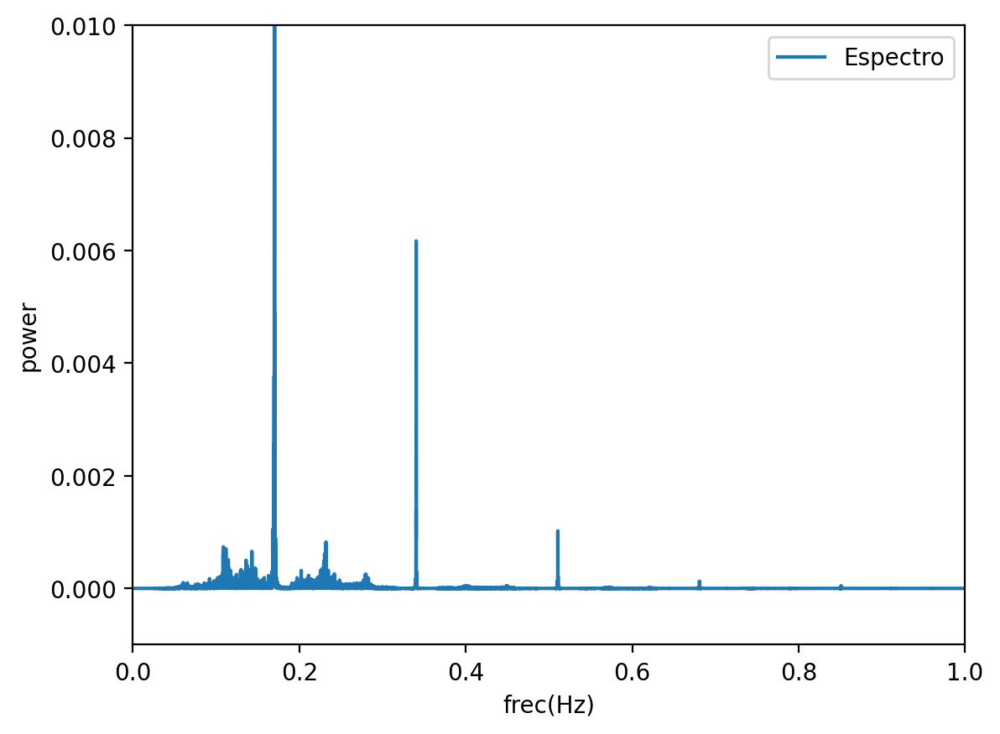

In [38]:
# Calculamos la transformado de Fourier de la señal
fourier_transform = np.fft.rfft(x3)
abs_fourier_transform = np.abs(fourier_transform)
power_spectrum = np.square(abs_fourier_transform)

# Normalizamos y quitamos el valor correspondiente al 0 de frecuencia (offset)
power_spectrum = power_spectrum[1:]
power_spectrum = power_spectrum/np.sum(power_spectrum)
frequency = np.linspace(0, 1/(2*dt), len(power_spectrum)+1)
frequency = frequency[1:]

# Ploteamos el espectro y una línea vertical roja donde esta la frecuencia del Forzante
plt.plot(frequency, power_spectrum, label='Espectro')
plt.xlabel('frec(Hz)')
plt.ylabel('power')
plt.xlim(0,1)

plt.ylim(-0.001,0.01)
plt.legend()
plt.show()

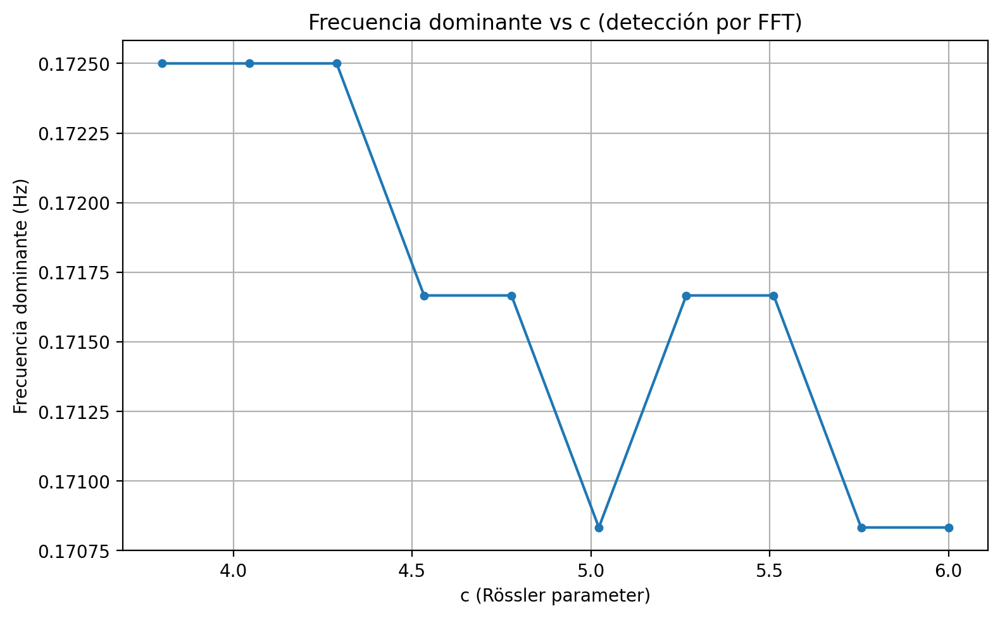

In [40]:
#2.3

from scipy.signal import find_peaks, windows, welch

c_vals = np.linspace(3.8, 6.0, 10)   # ajusta resolución del barrido

# integración
dt = 0.02               # paso de muestreo para guardar datos (ajusta si es necesario)
t_total = 2000.0        # tiempo total de integración (incrementa si resolución en freq es baja)
t_trans = 800.0         # tiempo a descartar (transitorio)
t_eval = np.arange(0, t_total, dt)

# resultados
dominant_freqs = []
power_at_dom = []

# muestreo (fs)
fs = 1.0 / dt

for c in c_vals:
    # Condiciones iniciales
    y0 = [1.0, 1.0, 1.0]

    # Integración numérica
    sol = sp.integrate.solve_ivp(rossler, [0, t_total], y0, args=(a, b, c),
                    t_eval=t_eval, rtol=1e-8, atol=1e-10)

    x = sol.y[0]

    # Descartar el transitorio
    idx_start = int(t_trans / dt)
    x_ss = x[idx_start:] - np.mean(x[idx_start:])

    # --- FFT directa ---
    Y = np.fft.rfft(x_ss)
    freqs = np.fft.rfftfreq(len(x_ss), d=dt)
    amplitude = np.abs(Y) / len(x_ss)  # normalización

    # Frecuencia dominante
    idx_dom = np.argmax(amplitude)
    f_dom = freqs[idx_dom]
    dominant_freqs.append(f_dom)



plt.figure(figsize=(8,5))
plt.plot(c_vals, dominant_freqs, '-o', markersize=4)
plt.xlabel('c (Rössler parameter)')
plt.ylabel('Frecuencia dominante (Hz)')
plt.title('Frecuencia dominante vs c (detección por FFT)')
plt.grid(True)
plt.tight_layout()
plt.show()

#mas rango para ver lo de la duplicacion.

---
# STFT

Recordemos la transformada discreta de Fourier (DFT), la cual nos permitía encontrar la composición espectral de una señal, por ejemplo, un audio. La definimos de manera tal que, dada una secuencia discreta de datos $x = [x_0, x_1, \ldots, x_{N-1}]$ de longitud $N$, la DFT de esta secuencia produce otra secuencia de $N$ elementos $X = [X_0, X_1, \ldots, X_{N-1}]$, donde cada $X_k$ representa una frecuencia específica de la señal. Por lo tanto, se describe como:

$$
X_k = \sum_{n=0}^{N-1} x_n e^{i \frac{2 \pi k n}{N}}
$$

De esta manera, obtengo la información de qué frecuencias aparecen en una señal pero no de cuándo aparecen esas frecuencias, lo cual puede ser particularmente útil para el análisis de cierto tipos de señales como por ejemplo el sonido. En estos casos, la dinamica de evolucion de las componentes de frecuencia es sumamente relevante, por lo que tener una resolucion temporal puede ser muy beneficioso. El objetivo de la STFT termina siendo ese. Obtener la presencia de distintas componentes de frecuencia a lo largo del del tiempo. Esto es lo que se llama espectrograma, o también sonograma cuando se trabaja explicitamente con sonido.

La forma en la que la STFT logra este objetivo se puede pensar conceptualmente como separar la serie en trozos y calcular la transformada de fourier para cada segmento. La implementación se realiza usando funciones de ventana con un corrimiento, de manera análoga a convolucionar la señal.

En el marco de métodos numéricos en física, la STFT y los espectrogramas permiten conectar la representación frecuencial con fenómenos reales, como la aparición de frecuencias características, la propagación de ondas, o la respuesta temporal de un sistema. Además, constituyen la base de muchos métodos modernos de análisis de datos y reconocimiento de patrones en señales y series temporales.

## Espectrograma

Para calcular el espectrograma "a mano" usando `numpy.fft`, dividimos la señal en segmentos, calculamos la FFT en cada segmento, y luego visualizamos los resultados en función del tiempo y las frecuencias. Este proceso simula lo que hace `scipy.signal.spectrogram`, pero con un control más explícito sobre cada paso.

1. **Segmentación**: La señal se divide en ventanas de tamaño `window_size` con un solapamiento de la mitad. `n_windows` calcula cuántas ventanas caben en la señal.

2. **FFT en ventanas**: Para cada segmento, calculamos la FFT usando `np.fft.fft`. Obtenemos sólo la mitad del espectro (`[:window_size // 2]`), debido a la simetría de los resultados de la FFT para señales reales.

3. **Magnitud**: La magnitud de la FFT para cada segmento representa la intensidad de cada frecuencia en la ventana correspondiente.

4. **Visualización**: Las frecuencias y tiempos se grafican en un espectrograma, con la magnitud en decibelios para resaltar los componentes dominantes.

Algunas consideraciones importantes a tener en cuenta son:

- **Resolución temporal y en frecuencia**: Como en el cálculo tradicional, el tamaño de la ventana afecta la resolución temporal y en frecuencia.
- **Simetría**: Debido a la simetría de la FFT en señales reales, sólo se usa la mitad del espectro.
- **Escala logarítmica**: Convertimos la magnitud a decibelios (`10 * np.log10`) para representar mejor los rangos de intensidad.

Este método permite entender cómo la FFT se usa en cada ventana para generar el espectrograma, y el resultado debería ser comparable a `scipy.signal.spectrogram`.

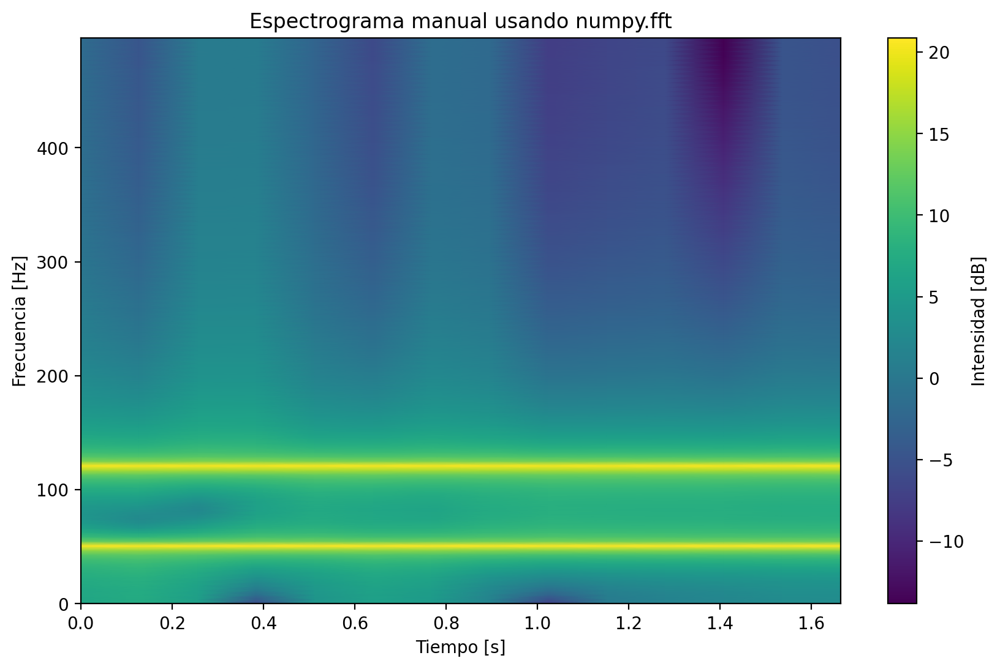

In [41]:
# Parámetros de la señal
fs = 1000  # Frecuencia de muestreo (Hz)
t = np.arange(0, 2, 1/fs)  # Tiempo de 2 segundos

# Señal de ejemplo con dos frecuencias
signal1 = np.sin(2 * np.pi * 50 * t)   # Componente de 50 Hz
signal2 = np.sin(2 * np.pi * 120 * t)  # Componente de 120 Hz
composite_signal = signal1 + signal2

# Parámetros del espectrograma
window_size = 256  # Tamaño de ventana (muestras)
overlap = window_size // 2  # Solapamiento
step = window_size - overlap  # Avance por ventana
n_windows = (len(composite_signal) - window_size) // step + 1  # Número de ventanas

# Matriz para almacenar el espectrograma
spectrogram = []

# Calcular la FFT en cada segmento
for i in range(n_windows):
    start = i * step
    end = start + window_size
    segment = composite_signal[start:end]

    # Aplicar FFT a la ventana
    segment_fft = np.fft.fft(segment, n=window_size)

    # Obtener la magnitud de las frecuencias hasta la mitad del espectro (simetría de Fourier)
    magnitude = np.abs(segment_fft[:window_size // 2])
    spectrogram.append(magnitude)

# Convertir a array para facilitar la visualización
spectrogram = np.array(spectrogram).T  # Transponer para que las frecuencias estén en el eje vertical

# Generar los ejes de tiempo y frecuencia
times = np.arange(n_windows) * (step / fs)
frequencies = np.fft.fftfreq(window_size, 1/fs)[:window_size // 2]

# Graficar el espectrograma
plt.figure(figsize=(10, 6))
plt.pcolormesh(times, frequencies, 10 * np.log10(spectrogram), shading='gouraud')
plt.colorbar(label='Intensidad [dB]')
plt.ylabel('Frecuencia [Hz]')
plt.xlabel('Tiempo [s]')
plt.title('Espectrograma manual usando numpy.fft')
plt.show()

Un espectrograma muestra cómo las frecuencias de una señal varían con el tiempo. Es una herramienta clave en el análisis de señales, especialmente para señales no estacionarias, donde la frecuencia cambia con el tiempo. Para calcular un espectrograma, dividimos la señal en segmentos, aplicamos la Transformada de Fourier en cada segmento, y luego graficamos las frecuencias obtenidas en función del tiempo.

Pasos para calcular el espectrograma:

1. **Segmentación**: Dividimos la señal en ventanas de tiempo más pequeñas, permitiendo observar la variación de frecuencias en cada intervalo.
2. **FFT en ventanas**: Calculamos la FFT para cada ventana y obtenemos las componentes de frecuencia.
3. **Mapeo del espectro**: Las frecuencias se representan en el eje vertical y el tiempo en el eje horizontal. La intensidad de las frecuencias se muestra con una escala de color.

Aquí usamos `scipy.signal.spectrogram`, que simplifica el cálculo y visualización del espectrograma:

- **Señal de ejemplo**: Creamos una señal con dos frecuencias (`50 Hz` y `120 Hz`) para ilustrar el espectrograma.
- **`scipy.signal.spectrogram`**: Esta función calcula el espectrograma de la señal, devolviendo:
  - `frequencies`: Las frecuencias en cada ventana.
  - `times`: Los intervalos de tiempo.
  - `Sxx`: La intensidad de las frecuencias a lo largo del tiempo.
- **Visualización**: Usamos `plt.pcolormesh` para graficar el espectrograma, con una escala de color logarítmica en dB para representar la intensidad de cada componente de frecuencia.

Tengan en cuenta que el tamaño de ventana afecta la resolución del espectrograma. Ventanas más largas mejoran la resolución en frecuencia pero reducen la resolución temporal, y viceversa. Respecto al solapamiento, aumentar el solapamiento entre ventanas ayuda a suavizar la variación de las frecuencias en el tiempo, aunque aumenta el costo computacional.

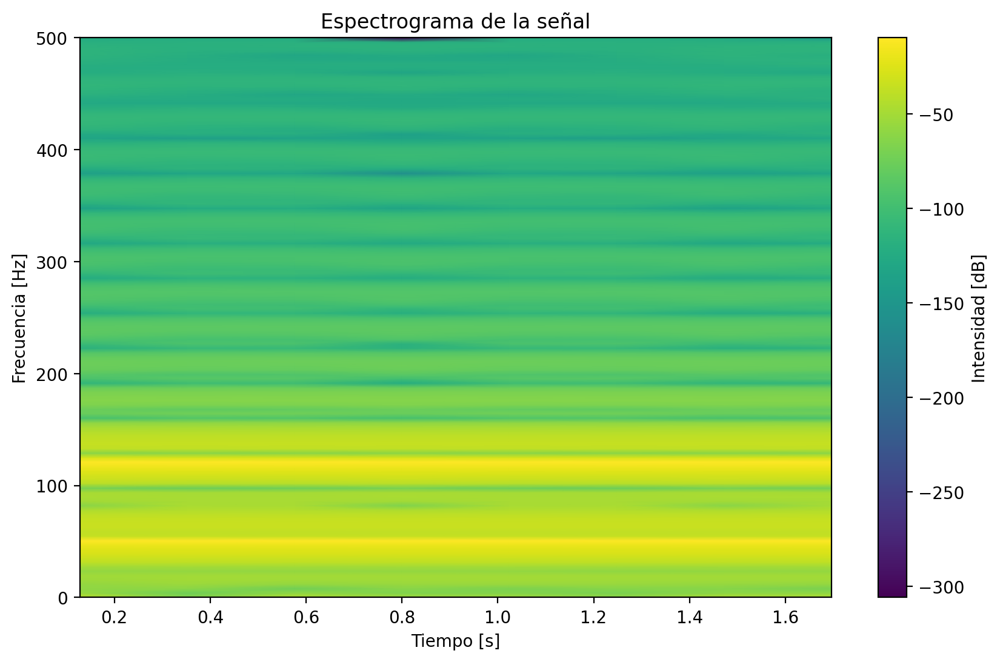

In [42]:
# Crear una señal de ejemplo: combinación de dos senoidales de diferentes frecuencias
fs = 1000  # frecuencia de muestreo en Hz
t = np.arange(0, 2, 1/fs)  # tiempo de 2 segundos
signal1 = np.sin(2 * np.pi * 50 * t)  # Componente de 50 Hz
signal2 = np.sin(2 * np.pi * 120 * t)  # Componente de 120 Hz
composite_signal = signal1 + signal2

# Calcular el espectrograma
frequencies, times, Sxx = sp.signal.spectrogram(composite_signal, fs)

# Graficar el espectrograma
plt.figure(figsize=(10, 6))
plt.pcolormesh(times, frequencies, 10 * np.log10(Sxx), shading='gouraud')
plt.colorbar(label='Intensidad [dB]')
plt.ylabel('Frecuencia [Hz]')
plt.xlabel('Tiempo [s]')
plt.title('Espectrograma de la señal')
plt.show()

---
# Ejercicio 3

Calculen los espectrogramas de los audios completos de la escala de do mayor en piano y guitarra que vimos al principio de la clase.

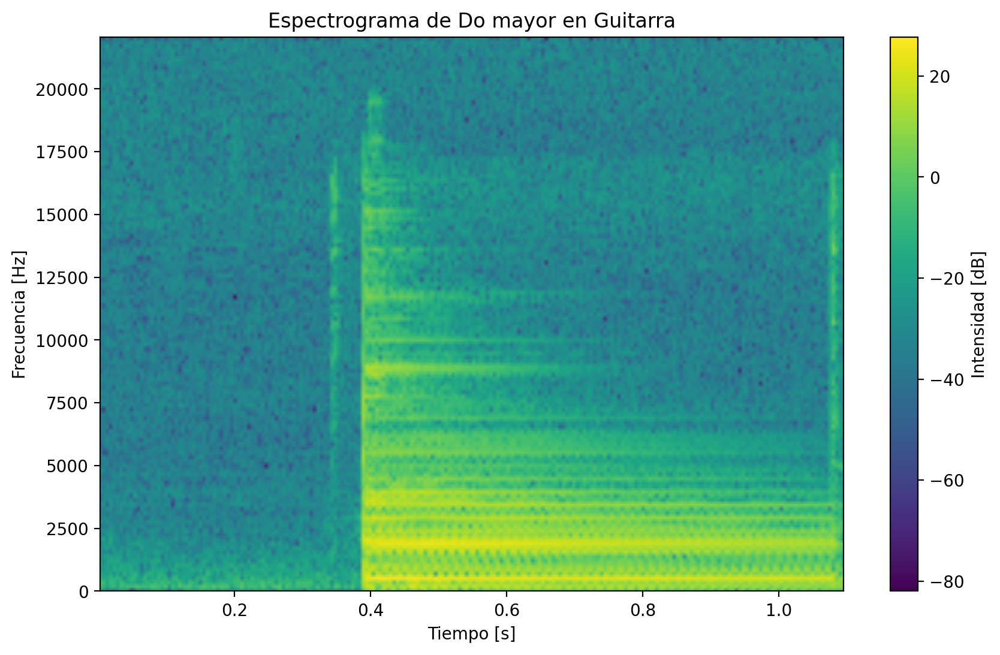

In [47]:
#Guitarra:

tiempo, amplitud = time_gtr[start_gtr:end_gtr], y_gtr[start_gtr:end_gtr]

# Calcular el espectrograma
frequencies, times, Sxx = sp.signal.spectrogram(amplitud, sr_gtr)

# Graficar el espectrograma
plt.figure(figsize=(10, 6))
plt.pcolormesh(times, frequencies, 10 * np.log10(Sxx), shading='gouraud')
plt.colorbar(label='Intensidad [dB]')
plt.ylabel('Frecuencia [Hz]')
plt.xlabel('Tiempo [s]')
plt.title('Espectrograma de Do mayor en Guitarra')
plt.show()

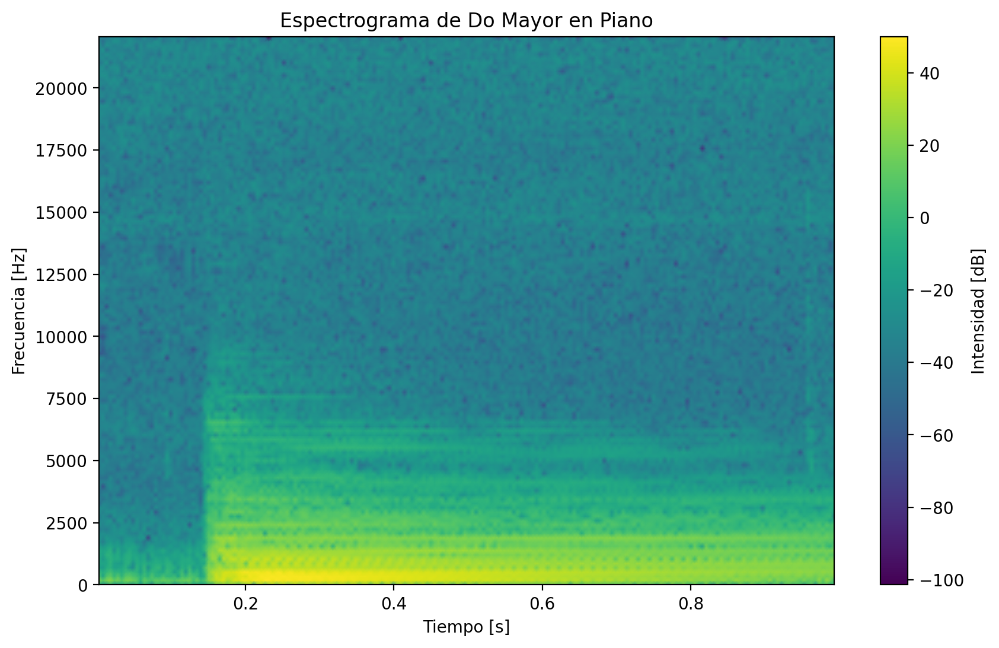

In [46]:
#Piano:

tiempo, amplitud = time_piano[start_piano:end_piano], y_piano[start_piano:end_piano]

# Calcular el espectrograma
frequencies, times, Sxx = sp.signal.spectrogram(amplitud, sr_piano)

# Graficar el espectrograma
plt.figure(figsize=(10, 6))
plt.pcolormesh(times, frequencies, 10 * np.log10(Sxx), shading='gouraud')
plt.colorbar(label='Intensidad [dB]')
plt.ylabel('Frecuencia [Hz]')
plt.xlabel('Tiempo [s]')
plt.title('Espectrograma de Do Mayor en Piano')
plt.show()

---
## Oscilaciones en sistemas dinámicos

Una aplicación que puede ser interesante en el marco de la materia es el de estudiar la composición espectral de oscilaciones que se "prenden" mediante distintos mecanismos dinámicos. De esta manera, podríamos usarlo para comparar como son las oscilaciones que surgen de una bifurcación de Hopf y aquellas que nacen en una Saddle-Node In Limit Cycle (SNILC).

### Bifurcacion de Hopf

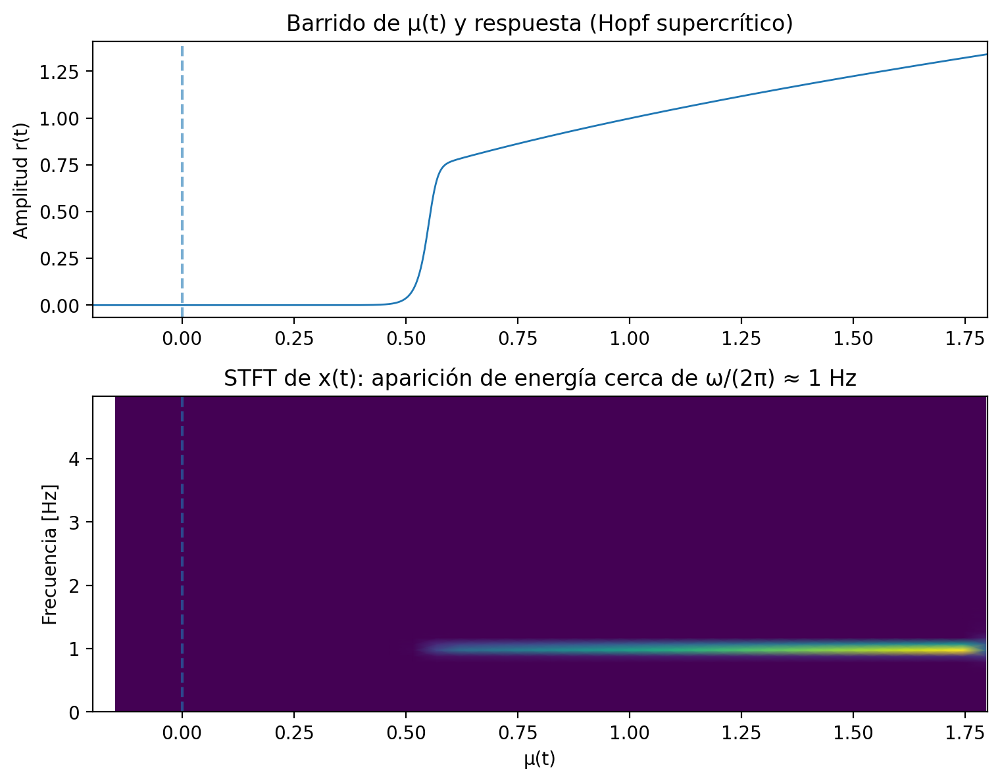

In [48]:
# Hopf supercrítico con parámetro barrido μ(t), integración con solve_ivp y espectrograma (STFT).
# Mapea el eje del tiempo a μ(t) para ver el "encendido" de la oscilación en la bifurcación.

omega = 2*np.pi*1.0   # frecuencia natural (1 Hz)
mu0   = -0.2          # μ inicial a t=0
alpha = 0.01          # velocidad de barrido: μ(t) = mu0 + alpha*t
T     = 200.0         # tiempo total
N     = 20000         # puntos para muestreo uniforme (importante para STFT)
t_eval = np.linspace(0.0, T, N)
dt = t_eval[1] - t_eval[0]
fs = 1.0/dt           # "frecuencia de muestreo" de la serie temporal

# Condición inicial: cerca del origen (reposo antes de Hopf)
x0, y0 = 1e-6, 0.0

def mu_t(t):
    return mu0 + alpha*t

def hopf(t, z):
    x, y = z
    mu = mu_t(t)
    r2 = x*x + y*y
    # Forma cartesiana del Hopf supercrítico:
    # dx = mu*x - omega*y - r^2*x
    # dy = omega*x + mu*y - r^2*y
    dx = mu*x - omega*y - r2*x
    dy = omega*x + mu*y - r2*y
    return [dx, dy]

sol = sp.integrate.solve_ivp(hopf, (0.0, T), [x0, y0], t_eval=t_eval, rtol=1e-8, atol=1e-10)

t = sol.t
x = sol.y[0]
y = sol.y[1]
r = np.sqrt(x**2 + y**2)
mu_series = mu_t(t)

# Espectrograma (STFT)
nperseg = 1024
noverlap = nperseg // 2
window = sp.signal.get_window('hann', nperseg)

f, t_spec, Zxx = sp.signal.stft(x, fs=fs, window=window, nperseg=nperseg, noverlap=noverlap, detrend=False, boundary=None)
power = np.abs(Zxx)**2  # densidad espectral

# Convertimos el eje de tiempo del espectrograma a μ(t)
mu_spec = mu0 + alpha*t_spec

# Gráficos
fig = plt.figure(figsize=(8, 6))

# 1) Amplitud vs μ
ax1 = plt.axes([0.1, 0.58, 0.85, 0.35])
ax1.plot(mu_series, r, lw=1.0)
ax1.axvline(0.0, ls='--', alpha=0.6)
ax1.set_ylabel("Amplitud r(t)")
ax1.set_title("Barrido de μ(t) y respuesta (Hopf supercrítico)")
ax1.set_xlim(mu_series.min(), mu_series.max())

# 2) Espectrograma con eje x en μ
ax2 = plt.axes([0.1, 0.08, 0.85, 0.40])
# Filtramos frecuencias por encima de, digamos, 5 Hz para claridad (opc.)
fmax = 5.0
mask_f = f <= fmax
pcm = ax2.pcolormesh(mu_spec, f[mask_f], power[mask_f, :], shading='gouraud')
ax2.axvline(0.0, ls='--', alpha=0.6)
ax2.set_xlabel("μ(t)")
ax2.set_ylabel("Frecuencia [Hz]")
ax2.set_title("STFT de x(t): aparición de energía cerca de ω/(2π) ≈ 1 Hz")
ax2.set_xlim(mu_series.min(), mu_series.max())
# cb = plt.colorbar(pcm, ax=ax2, pad=0.01)
# cb.set_label("Potencia")

plt.show()


En el gráfico de arriba se ve que antes de $\mu=0$, la amplitud x(t) es cero (el sistema está en un punto fijo estable). Justo después de $\mu=0$, la amplitud comienza a crecer suave y continuamente desde cero.

El espectrograma muestra una banda de potencia horizontal. Esta banda aparece en $\mu=0$ a una frecuencia específica y no nula (alrededor de 1 Hz, que es el $\omega$ que definimos). A medida que $\mu$ aumenta, la potencia (color) de esta banda se intensifica (reflejando el aumento de amplitud), y la frecuencia se mantiene en ese valor tonal.

### Bifurcación de SNILC

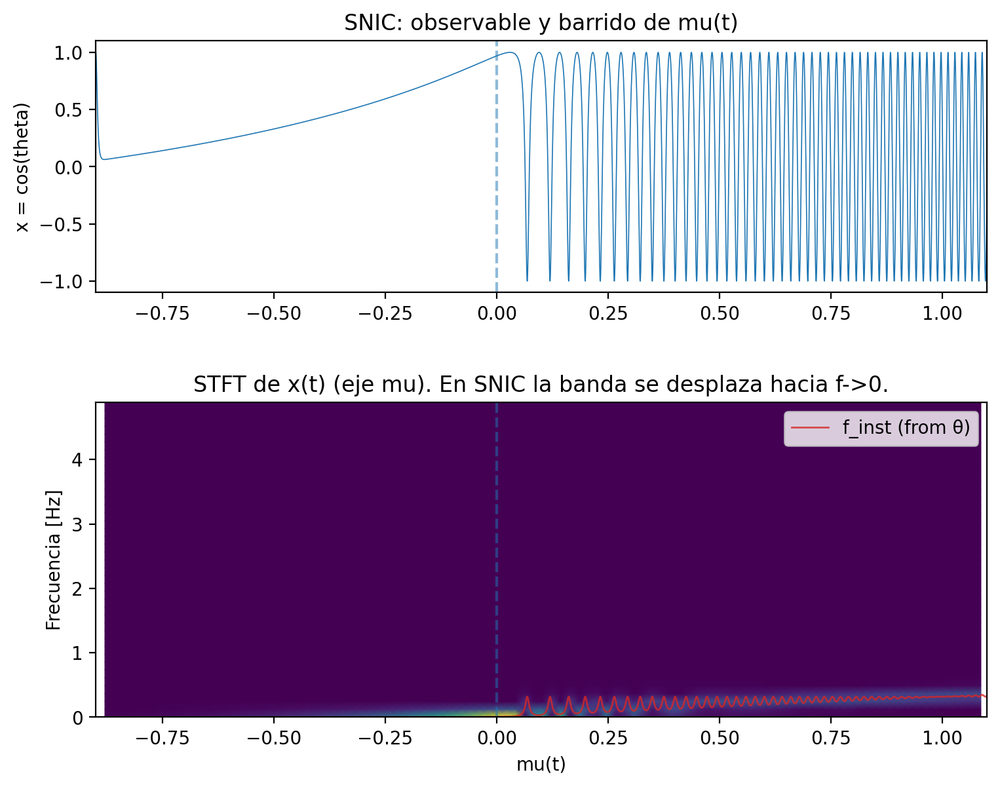

In [49]:
mu0   = -0.9        # valor inicial (elige cerca del umbral)
alpha = 5e-3        # velocidad de barrido de mu: mu(t) = mu0 + alpha*t
T     = 400.0       # tiempo total (largo porque frecuencias se hacen muy bajas)
N     = 200000      # puntos muestreados (para buena resolución temporal)
t_eval = np.linspace(0.0, T, N)
dt = t_eval[1] - t_eval[0]
fs = 1.0/dt

# condición inicial (fase)
theta0 = 0.1

def mu_t(t):
    return mu0 + alpha*t

def snic_theta(t, th):
    # dtheta/dt = mu(t) + cos(theta)
    return (1 - np.cos(th)) + (1 + np.cos(th)) * mu_t(t)
    # return mu_t(t) + np.cos(th[0])

sol = sp.integrate.solve_ivp(snic_theta, (0.0, T), [theta0], t_eval=t_eval, rtol=1e-8, atol=1e-10)
t = sol.t
theta = sol.y[0]
# mantener fase continua (unwrap)
theta_un = np.unwrap(theta)

# observable de amplitud constante
x = np.cos(theta_un)
mu_series = mu_t(t)

# df_inst = derivative of theta / (2*pi)
omega_inst = np.gradient(theta_un, t)        # dtheta/dt
f_inst = omega_inst / (2*np.pi)

# para bajas freq: ventana larga. Ajustá nperseg según T y fs.
nperseg = 4096   # aumentar si tenés muchos datos y barrido muy lento
noverlap = nperseg // 2
window = sp.signal.get_window('hann', nperseg)

f, t_spec, Zxx = sp.signal.stft(x, fs=fs, window=window, nperseg=nperseg, noverlap=noverlap, detrend=False, boundary=None)
power = np.abs(Zxx)**2

# eje mu para el espectrograma
mu_spec = mu0 + alpha*t_spec

fig = plt.figure(figsize=(8,6))
ax1 = plt.axes([0.1, 0.62, 0.85, 0.32])
ax1.plot(mu_series, x, lw=0.6)
ax1.set_ylabel('x = cos(theta)')
ax1.set_title('SNIC: observable y barrido de mu(t)')
ax1.axvline(0.0, ls='--', alpha=0.5)
ax1.set_xlim(mu_series.min(), mu_series.max())

ax2 = plt.axes([0.1, 0.08, 0.85, 0.40])
# limitar fmax para visual (e.g., 5 Hz)
fmax = 5.0
mask_f = f <= fmax
pcm = ax2.pcolormesh(mu_spec, f[mask_f], power[mask_f, :], shading='gouraud')
ax2.set_xlabel('mu(t)')
ax2.set_ylabel('Frecuencia [Hz]')
ax2.set_title('STFT de x(t) (eje mu). En SNIC la banda se desplaza hacia f->0.')
# superponer frecuencia instantánea (convertir tiempo->mu)
# mu_inst en tiempos t; mu_inst deben interpolarse sobre mu_spec si se desea
ax2.plot(mu_series, np.clip(f_inst, 0, fmax), color='C3', lw=1.0, alpha=0.8, label='f_inst (from θ)')
ax2.axvline(0.0, ls='--', alpha=0.5)
ax2.set_xlim(mu_series.min(), mu_series.max())
ax2.legend()
# cb = plt.colorbar(pcm, ax=ax2, pad=0.01)
# cb.set_label('Potencia')
# plt.subplots_adjust(hspace=0.5)
plt.show()


En el gráfico de arriba, se ve que previo a $\mu=0$, el sistema está en un punto fijo (x(t) es constante). Justo después de $\mu=0$, el sistema inmediatamente comienza a oscilar con una amplitud completa (entre -1 y 1, ya que usamos $\cos(\theta)$). Lo que cambia no es la amplitud, sino la frecuencia de la oscilación.

El gráfico de la STFT muestra la diferencia clave con Hopf. La banda de potencia nace en $\mu=0$ pegada al eje de frecuencia = 0 Hz. A medida que $\mu$ aumenta (me muevo hacia la derecha), la frecuencia de la oscilación aumenta, lo que se ve como una curva que "despega" desde cero.

---
# Aplicaciones en series temporales

## Filtros

Vamos a ver un ejemplo de filtrado de ruido en señales temporales. Para eso generamos una señal sinusoidal con ruido en frecuencias altas.

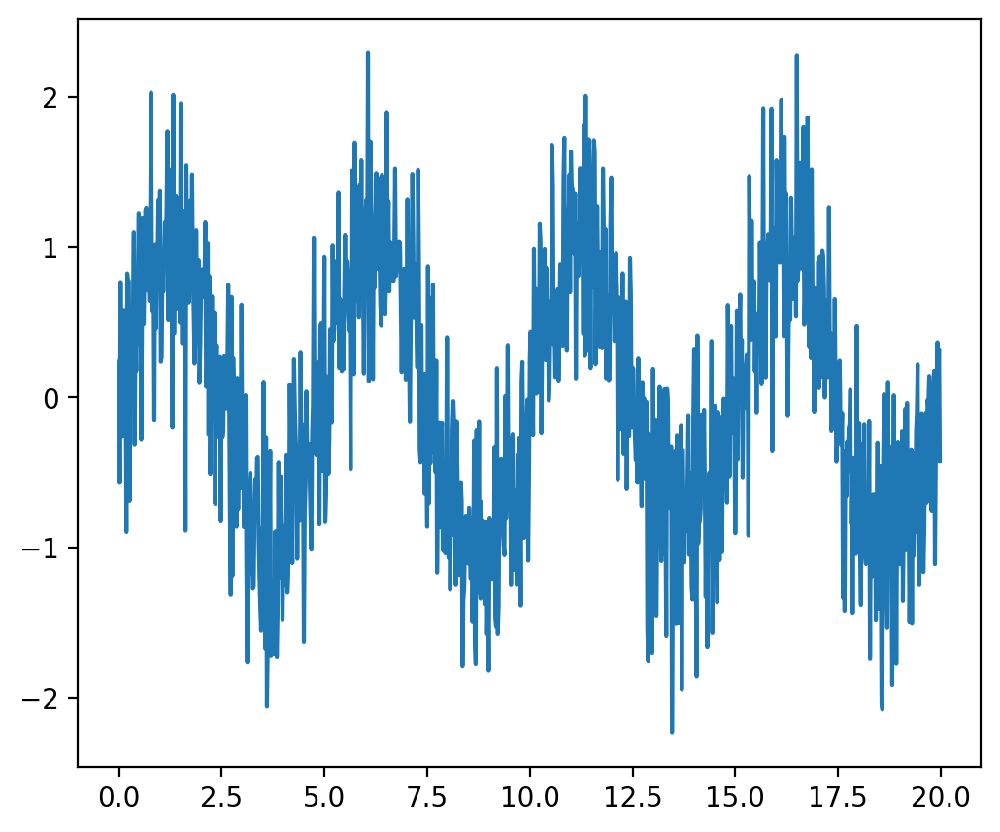

In [50]:
np.random.seed(1234)

time_step = 0.02
period = 5.

time_vec = np.arange(0, 20, time_step)
sig = (np.sin(2 * np.pi / period * time_vec)
       + 0.5 * np.random.randn(time_vec.size))

plt.figure(figsize=(6, 5))
plt.plot(time_vec, sig, label='Original signal')

[]

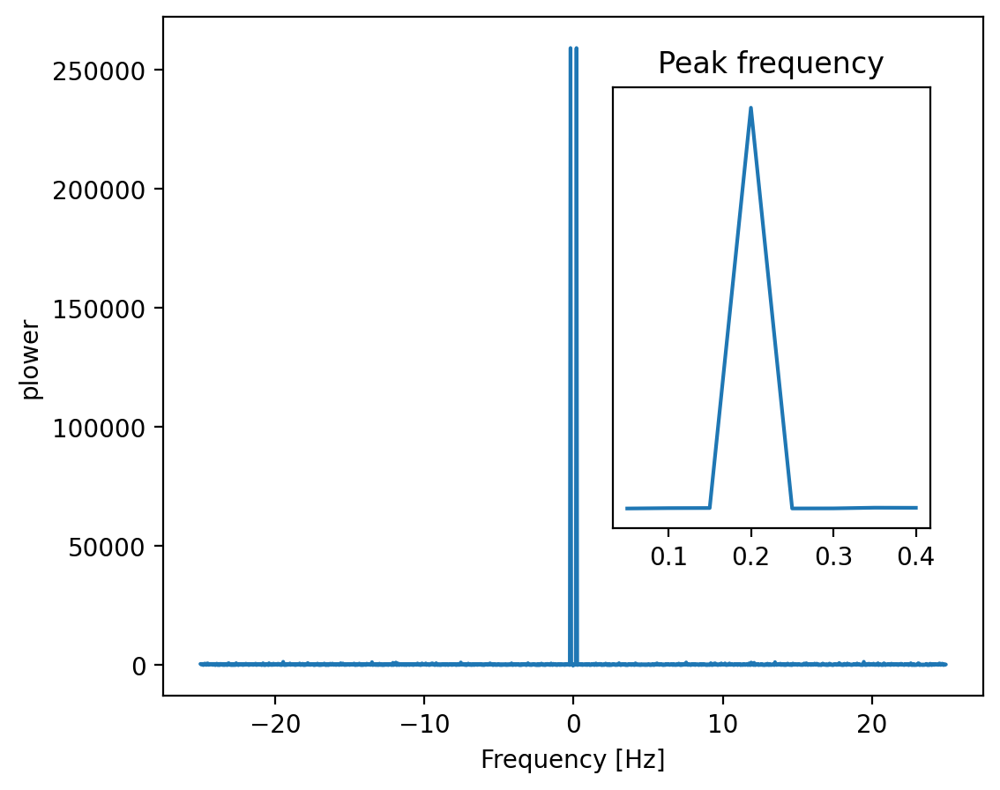

In [51]:
# The FFT of the signal
sig_fft = sp.fftpack.fft(sig)

# And the power (sig_fft is of complex dtype)
power = np.abs(sig_fft)**2

# The corresponding frequencies
sample_freq = sp.fftpack.fftfreq(sig.size, d=time_step)

# Plot the FFT power
plt.figure(figsize=(6, 5))
plt.plot(sample_freq, power)
plt.xlabel('Frequency [Hz]')
plt.ylabel('plower')

# Find the peak frequency: we can focus on only the positive frequencies
pos_mask = np.where(sample_freq > 0)
freqs = sample_freq[pos_mask]
peak_freq = freqs[power[pos_mask].argmax()]

# Check that it does indeed correspond to the frequency that we generate
# the signal with
np.allclose(peak_freq, 1./period)

# An inner plot to show the peak frequency
axes = plt.axes([0.55, 0.3, 0.3, 0.5])
plt.title('Peak frequency')
plt.plot(freqs[:8], power[pos_mask][:8])
plt.setp(axes, yticks=[])

# scipy.signal.find_peaks_cwt can also be used for more advanced
# peak detection

Ahora eliminamos todas las frecuencias altas y transformamos nuevamente las frecuencias en señales.

/usr/local/lib/python3.12/dist-packages/matplotlib/cbook.py:1709: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/usr/local/lib/python3.12/dist-packages/matplotlib/cbook.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


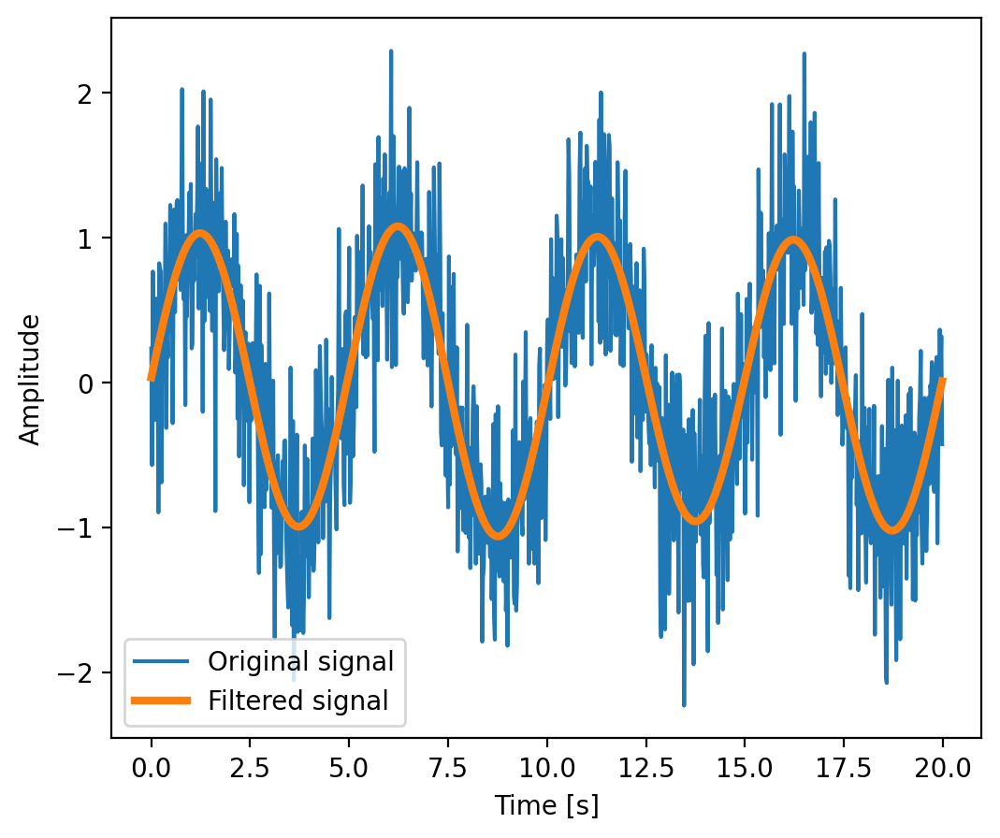

In [52]:
high_freq_fft = sig_fft.copy()
high_freq_fft[np.abs(sample_freq) > peak_freq] = 0
filtered_sig = sp.fftpack.ifft(high_freq_fft)

plt.figure(figsize=(6, 5))
plt.plot(time_vec, sig, label='Original signal')
plt.plot(time_vec, filtered_sig, linewidth=3, label='Filtered signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')

plt.legend(loc='best')
plt.show()

---
### Ejercicio 4

Volvamos a los datos de [tránsito de peatones](https://archive.ics.uci.edu/dataset/536/pedestrian+in+traffic+dataset), que vimos en clases pasadas.

In [53]:
!pip install ucimlrepo

In [54]:
import pandas as pd

In [55]:
from ucimlrepo import fetch_ucirepo

# fetch dataset
pedestrians_in_traffic = fetch_ucirepo(id=536)
# data (as pandas dataframes)
X = pedestrians_in_traffic.data.features
y = pedestrians_in_traffic.data.targets


In [58]:
pos_x = X[X['oid'] == 19339]['x'].to_numpy()
pos_y = X[X['oid'] == 19339]['y'].to_numpy()
times = np.arange(0, len(pos_x))

4.1. Computen la FFT de las posiciones en $x$ y en $y$.

4.2. Filtren frecuencias altas a partir de reducir las componentes de la transformada y después antitransformar.

4.3. Muestren los gráficos de antes y después de las señales.

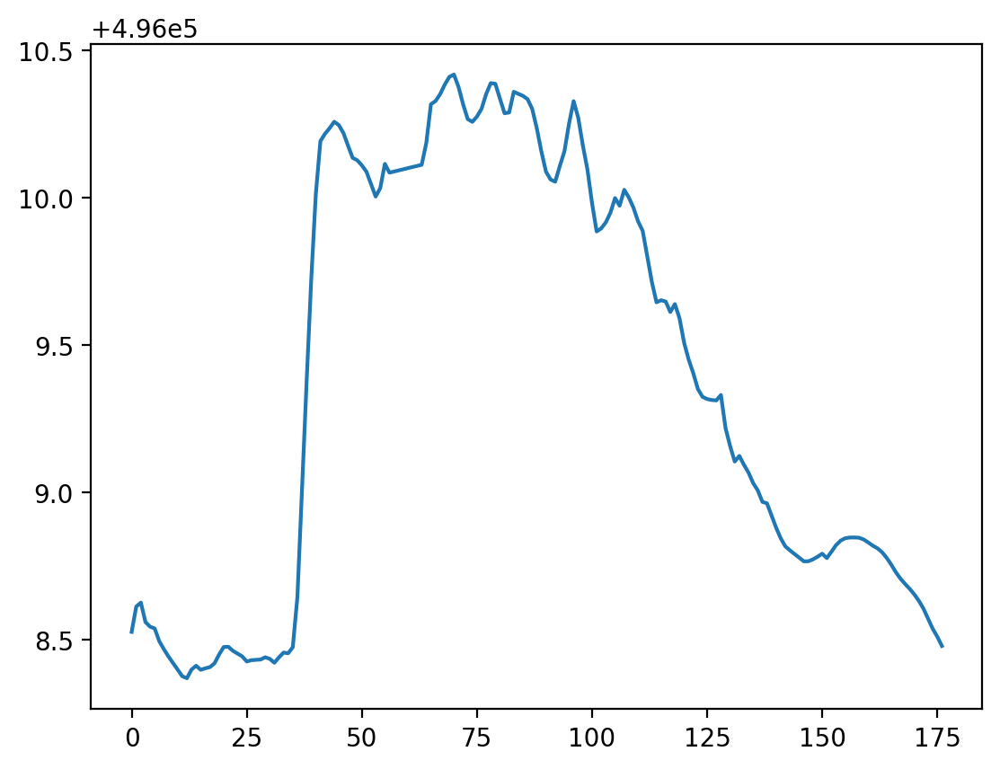

In [64]:
plt.plot(times, pos_x)
#plt.plot(times, pos_y)
plt.show()

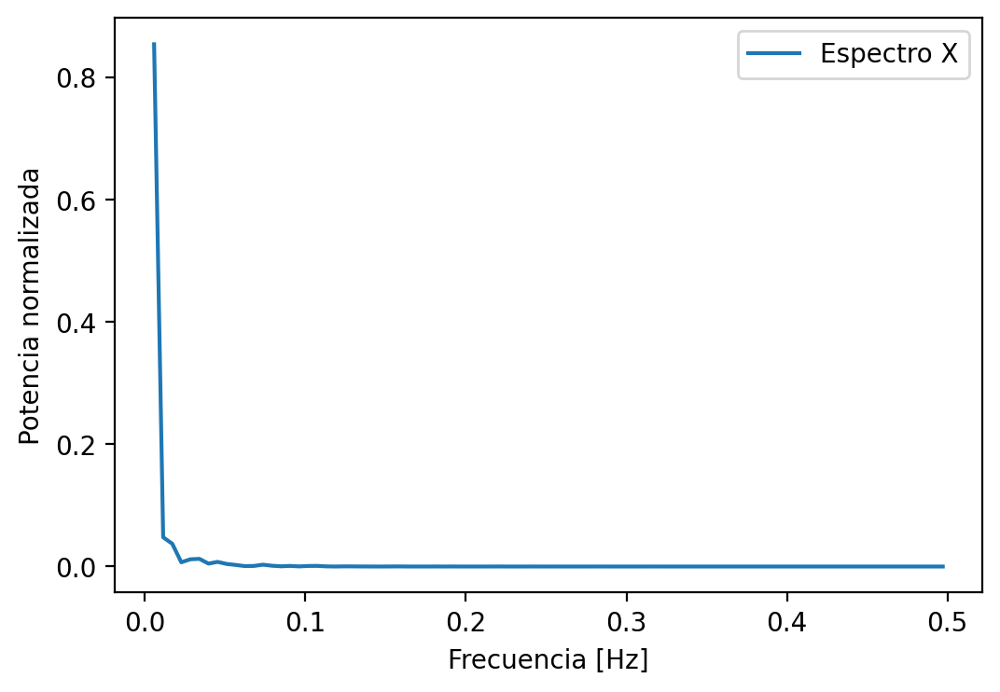

In [61]:
#4.1

#X

dt = times[1] - times[0]

fourier_transform = np.fft.rfft(pos_x)
power_spectrum = np.abs(fourier_transform)**2
power_spectrum = power_spectrum[1:]               # quitar DC
power_spectrum = power_spectrum / np.sum(power_spectrum)  # normalizar

frequency = np.fft.rfftfreq(len(pos_x), d=dt)[1:]  # frecuencias correspondientes

plt.figure(figsize=(6,4))
plt.plot(frequency, power_spectrum, label='Espectro X')
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Potencia normalizada')

plt.legend()
plt.show()

[]

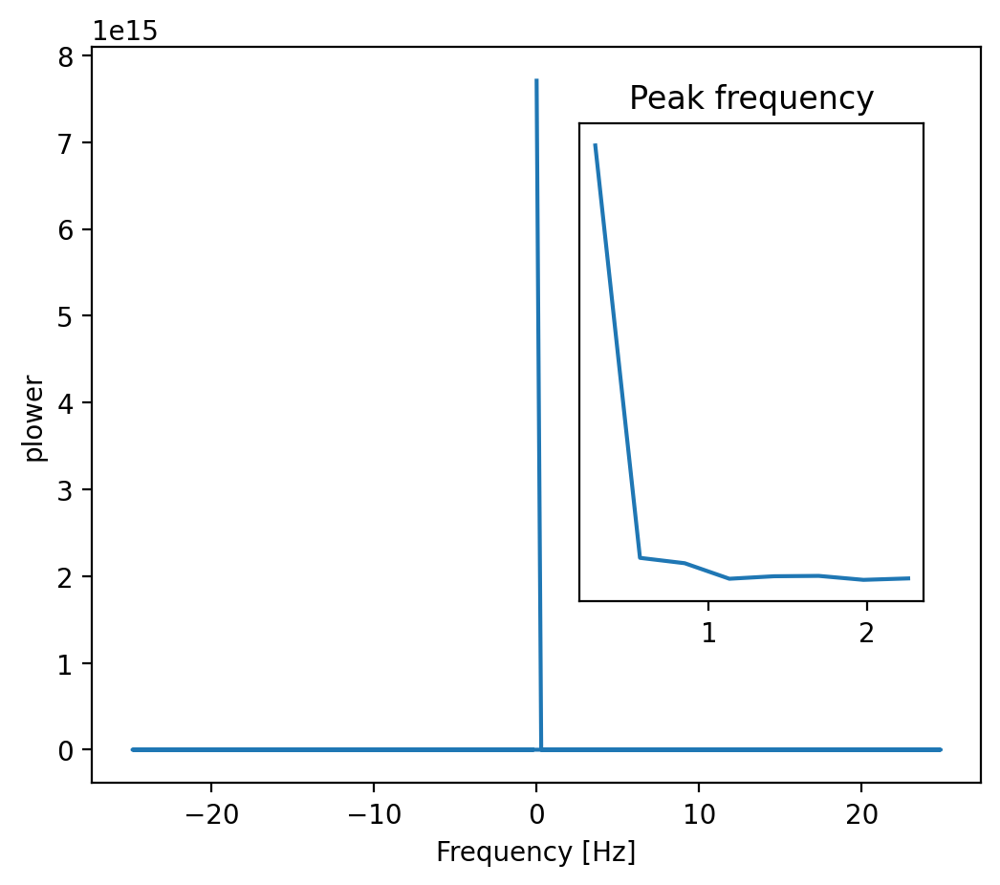

In [67]:
# The FFT of the signal
sig_fft = sp.fftpack.fft(pos_x)

# And the power (sig_fft is of complex dtype)
power = np.abs(sig_fft)**2

# The corresponding frequencies
sample_freq = sp.fftpack.fftfreq(pos_x.size, d=time_step)

# Plot the FFT power
plt.figure(figsize=(6, 5))
plt.plot(sample_freq, power)
plt.xlabel('Frequency [Hz]')
plt.ylabel('plower')

# Find the peak frequency: we can focus on only the positive frequencies
pos_mask = np.where(sample_freq > 0)
freqs = sample_freq[pos_mask]
peak_freq = freqs[power[pos_mask].argmax()]

# Check that it does indeed correspond to the frequency that we generate
# the signal with
np.allclose(peak_freq, 1./period)

# An inner plot to show the peak frequency
axes = plt.axes([0.55, 0.3, 0.3, 0.5])
plt.title('Peak frequency')
plt.plot(freqs[:8], power[pos_mask][:8])
plt.setp(axes, yticks=[])


/usr/local/lib/python3.12/dist-packages/matplotlib/cbook.py:1709: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/usr/local/lib/python3.12/dist-packages/matplotlib/cbook.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


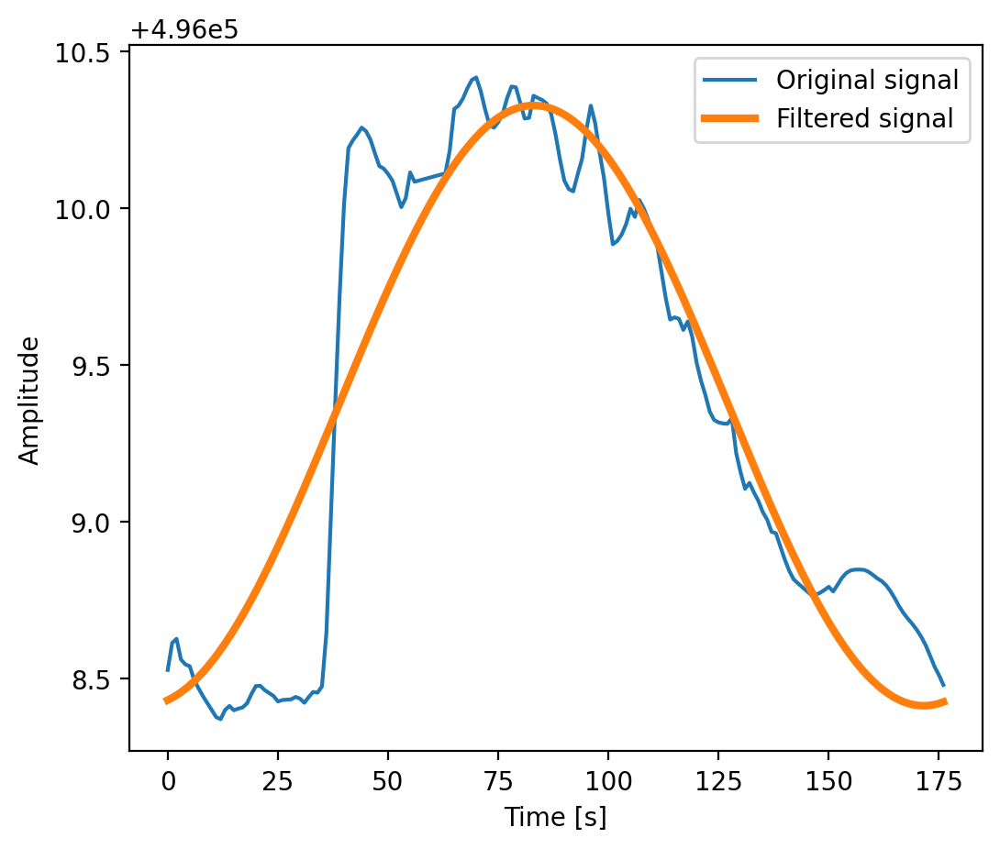

In [70]:
high_freq_fft = sig_fft.copy()
high_freq_fft[np.abs(sample_freq) > peak_freq] = 0
filtered_sig = sp.fftpack.ifft(high_freq_fft)

plt.figure(figsize=(6, 5))
plt.plot(times, pos_x, label='Original signal')
plt.plot(times, filtered_sig, linewidth=3, label='Filtered signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')

plt.legend(loc='best')
plt.show()

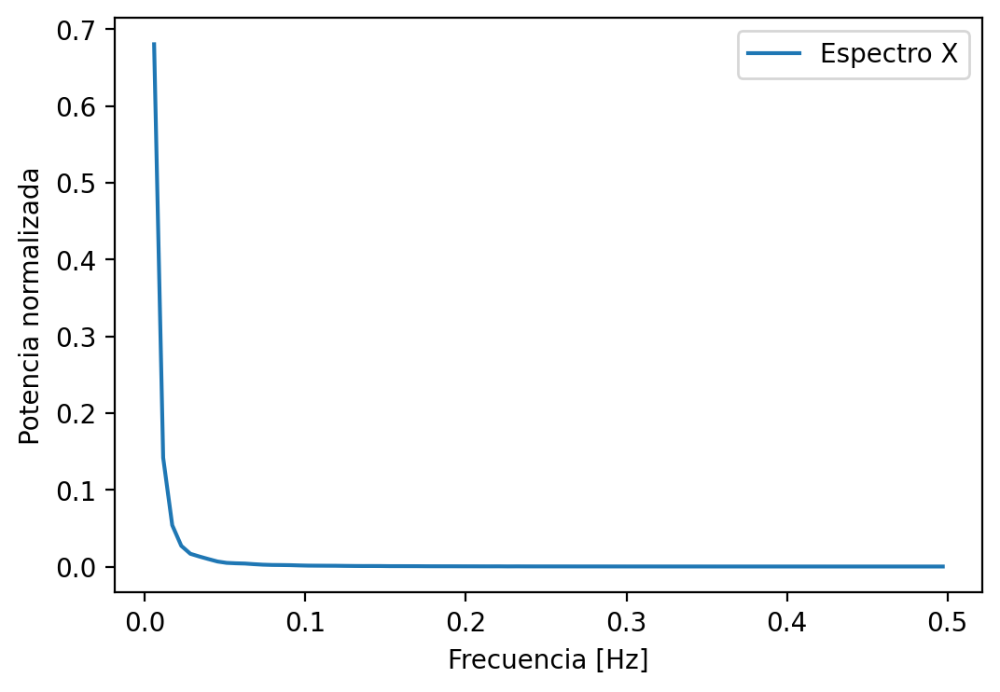

In [65]:
#Y

dt = times[1] - times[0]

fourier_transform = np.fft.rfft(pos_y)
power_spectrum = np.abs(fourier_transform)**2
power_spectrum = power_spectrum[1:]               # quitar DC
power_spectrum = power_spectrum / np.sum(power_spectrum)  # normalizar

frequency = np.fft.rfftfreq(len(pos_y), d=dt)[1:]  # frecuencias correspondientes

plt.figure(figsize=(6,4))
plt.plot(frequency, power_spectrum, label='Espectro X')
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Potencia normalizada')

plt.legend()
plt.show()

[]

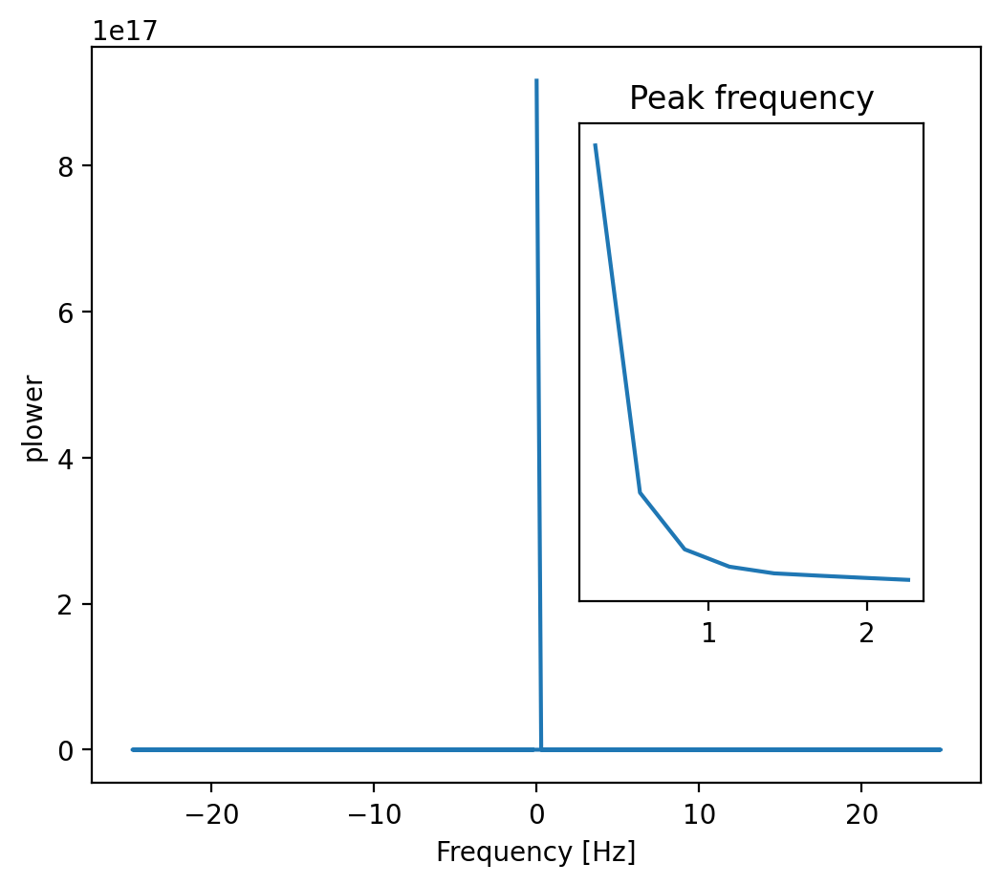

In [71]:
# The FFT of the signal
sig_fft = sp.fftpack.fft(pos_y)

# And the power (sig_fft is of complex dtype)
power = np.abs(sig_fft)**2

# The corresponding frequencies
sample_freq = sp.fftpack.fftfreq(pos_y.size, d=time_step)

# Plot the FFT power
plt.figure(figsize=(6, 5))
plt.plot(sample_freq, power)
plt.xlabel('Frequency [Hz]')
plt.ylabel('plower')

# Find the peak frequency: we can focus on only the positive frequencies
pos_mask = np.where(sample_freq > 0)
freqs = sample_freq[pos_mask]
peak_freq = freqs[power[pos_mask].argmax()]

# Check that it does indeed correspond to the frequency that we generate
# the signal with
np.allclose(peak_freq, 1./period)

# An inner plot to show the peak frequency
axes = plt.axes([0.55, 0.3, 0.3, 0.5])
plt.title('Peak frequency')
plt.plot(freqs[:8], power[pos_mask][:8])
plt.setp(axes, yticks=[])

/usr/local/lib/python3.12/dist-packages/matplotlib/cbook.py:1709: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/usr/local/lib/python3.12/dist-packages/matplotlib/cbook.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


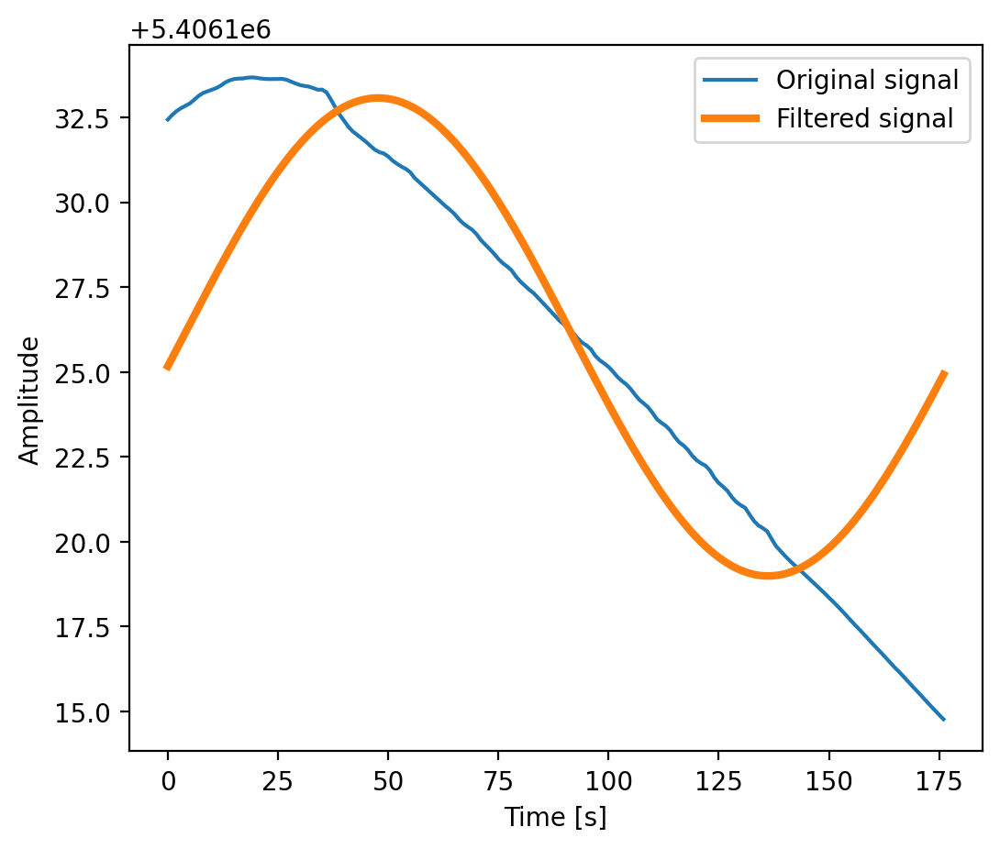

In [73]:
high_freq_fft = sig_fft.copy()
high_freq_fft[np.abs(sample_freq) > peak_freq] = 0
filtered_sig = sp.fftpack.ifft(high_freq_fft)

plt.figure(figsize=(6, 5))
plt.plot(times, pos_y, label='Original signal')
plt.plot(times, filtered_sig, linewidth=3, label='Filtered signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')

plt.legend(loc='best')
plt.show()

---
# Aplicaciones en imágenes

La transformada de Fourier es una herramienta poderosa para el procesamiento de imágenes. Usando la FFT, podemos filtrar ruido en imágenes y comprimirlas seleccionando componentes de baja frecuencia, que suelen contener la mayor parte de la información visual.

---
**Ejemplo**

Veamos un ejemplo de uso de la FFT para el estudio de patrones en imágenes.


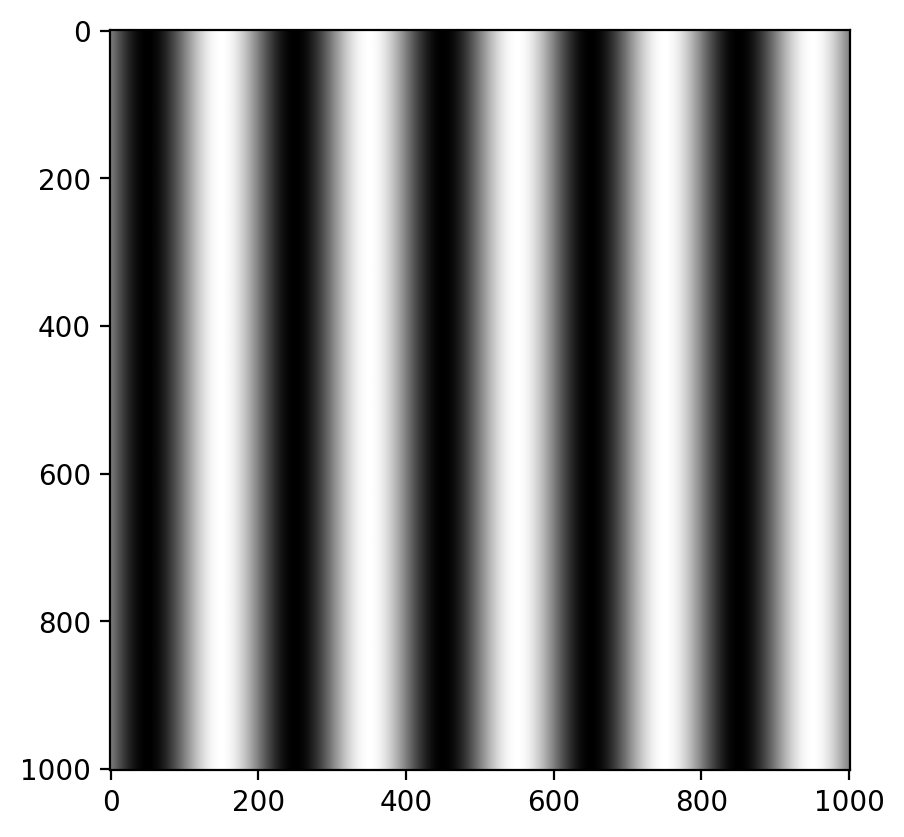

In [74]:
x = np.arange(-500, 501, 1)
X, Y = np.meshgrid(x, x)
wavelength = 200
grating = np.sin(2 * np.pi * X / wavelength)
plt.set_cmap("gray")
plt.imshow(grating)
plt.show()

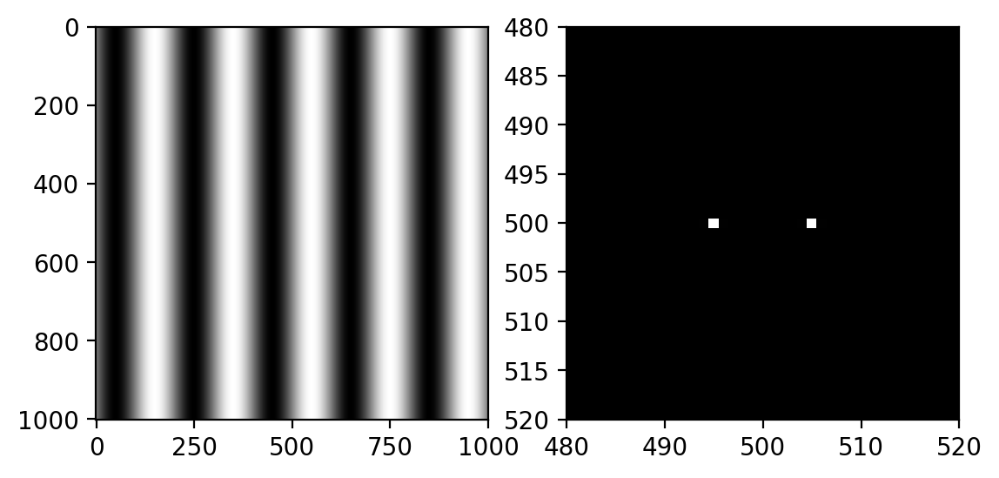

In [75]:
x = np.arange(-500, 501, 1)
X, Y = np.meshgrid(x, x)

wavelength = 200
angle = 0
grating = np.sin(
    2*np.pi*(X*np.cos(angle) + Y*np.sin(angle)) / wavelength
)

# Calculate Fourier transform of grating
ft = np.fft.ifftshift(grating)
ft = np.fft.fft2(ft)
ft = np.fft.fftshift(ft)

plt.set_cmap("gray")
plt.subplot(121)
plt.imshow(grating)

plt.subplot(122)
plt.imshow(abs(ft))
plt.xlim([480, 520])
plt.ylim([520, 480])  # Note, order is reversed for y
plt.show()

La rejilla sinusoidal de la izquierda es la que se vio anteriormente. A la derecha se muestra la representación visual de la transformada de Fourier de esta rejilla. Muestra un valor de 0 en todas partes excepto en dos puntos. Recuerden que el array tiene un tamaño de 1001 x 1001 y, por lo tanto, su centro es (500, 500). Los puntos se encuentran en las coordenadas (495, 500) y (505, 500). Cada uno está a cinco píxeles del centro. Estos puntos siempre son simétricos alrededor del punto central.

Esta simetría es la razón por la que elegimos que las dimensiones del array sean impares. Un array con dimensiones impares tiene un solo píxel que representa el centro, mientras que cuando las dimensiones son pares, el centro se comparte entre cuatro píxeles.

El par de puntos en la transformada de Fourier representa la red sinusoidal. Los puntos siempre se presentan en pares simétricos en la transformada de Fourier.

Veamos ahora un patrón oblicuo, para ver como cambia la representación en el espacio de frecuencias. Además, vamos a ver cómo puedo aplicar la antitransformada para volver a la imágen original.

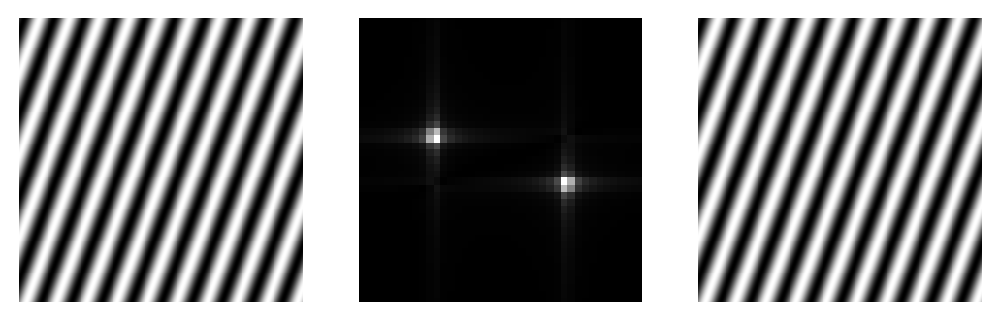

In [76]:
x = np.arange(-500, 501, 1)
X, Y = np.meshgrid(x, x)

wavelength = 100
angle = np.pi/9
grating = np.sin(
    2*np.pi*(X*np.cos(angle) + Y*np.sin(angle)) / wavelength
)

# Calculate the Fourier transform of the grating
ft = np.fft.ifftshift(grating)
ft = np.fft.fft2(ft)
ft = np.fft.fftshift(ft)

# Calculate the inverse Fourier transform of
# the Fourier transform
ift = np.fft.ifftshift(ft)
ift = np.fft.ifft2(ift)
ift = np.fft.fftshift(ift)
ift = ift.real  # Take only the real part

plt.set_cmap("gray")
plt.subplot(131)
plt.imshow(grating)
plt.axis("off")

plt.subplot(132)
plt.imshow(abs(ft))
plt.axis("off")
plt.xlim([480, 520])
plt.ylim([520, 480])

plt.subplot(133)
plt.imshow(ift)
plt.axis("off")
plt.show()

La distancia de estos puntos al centro es la misma que en el ejemplo anterior. Esta distancia representa la frecuencia de la rejilla sinusoidal. Cuanto más alejados estén los puntos del centro, mayor será la frecuencia que representan.

La orientación de los puntos representa la orientación de la rejilla. La línea que une los puntos con el centro forma un ángulo de 20° con la horizontal, igual que el ángulo de la rejilla.

Los demás parámetros de la rejilla también se representan en la transformada de Fourier. El valor de los píxeles que componen los puntos en la transformada de Fourier representa la amplitud de la rejilla. La información sobre la fase también está codificada en la matriz compleja de la transformada de Fourier. Sin embargo, se muestra el valor absoluto de la transformada de Fourier. Por lo tanto, la imagen que se muestra no muestra la fase, pero la información sigue estando presente en la matriz de la transformada de Fourier antes de obtener el valor absoluto.

---
## Filtrado de ruido en imágenes

Las imágenes suelen tener ruido en las componentes de alta frecuencia. Para reducir este ruido, transformamos la imagen al dominio de la frecuencia usando la FFT, aplicamos un filtro de paso bajo (que atenúa las altas frecuencias), y luego volvemos al dominio del espacio mediante la transformada inversa.


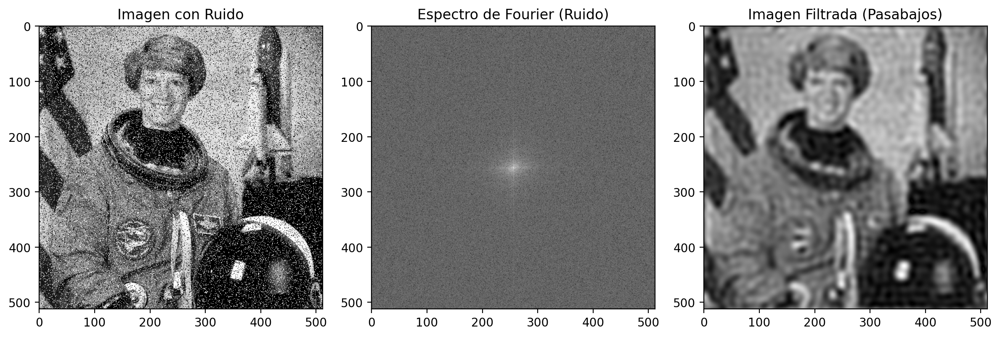

In [77]:
from skimage import data, color, util
from numpy.fft import fft2, ifft2, fftshift, ifftshift

# Cargar una imagen de ejemplo y convertirla a escala de grises
image = color.rgb2gray(data.astronaut())
noisy_image = util.random_noise(image, mode='s&p', amount=0.2)  # Agregar ruido de sal y pimienta

# Realizar la FFT de la imagen
F_noisy = fft2(noisy_image)
F_noisy_shifted = fftshift(F_noisy)  # Centramos el espectro en (0, 0)

# Definir el filtro de paso bajo
def low_pass_filter(F, radius):
    h, w = F.shape
    center_y, center_x = h // 2, w // 2
    mask = np.zeros((h, w), dtype=np.uint8)
    Y, X = np.ogrid[:h, :w]
    distance = np.sqrt((X - center_x)**2 + (Y - center_y)**2)
    mask[distance <= radius] = 1
    return F * mask

# Aplicar el filtro de paso bajo
radius = 30
F_filtered = low_pass_filter(F_noisy_shifted, radius)

# Transformada inversa para obtener la imagen filtrada
F_filtered_shifted = ifftshift(F_filtered)  # Revertimos el centro
image_filtered = np.abs(ifft2(F_filtered_shifted))

# Mostrar las imágenes originales y filtradas
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(noisy_image, cmap='gray')
plt.title("Imagen con Ruido")

plt.subplot(1, 3, 2)
plt.imshow(np.log(1 + np.abs(F_noisy_shifted)), cmap='gray')
plt.title("Espectro de Fourier (Ruido)")

plt.subplot(1, 3, 3)
plt.imshow(image_filtered, cmap='gray')
plt.title("Imagen Filtrada (Pasabajos)")

plt.tight_layout()
plt.show()

---
## Compresión de imágenes

En la compresión, eliminamos algunas componentes de frecuencia menos importantes para reducir la cantidad de datos sin perder mucha información visual. Al limitar las frecuencias a un rango bajo, podemos representar la imagen de manera más compacta.

Para comprimir la imagen, mantendremos solo las componentes de frecuencia más bajas (que corresponden a las grandes variaciones) y reduciremos las componentes de alta frecuencia (que corresponden a los detalles finos).

Algunas consideraciones importante para tener en cuenta:

1. **Simetría del Espectro**: Para imágenes reales, el espectro es simétrico; es importante centrarlas con `fftshift`.
2. **Alias y Frecuencia**: Mantener frecuencias bajas en la compresión, y filtrar las altas para evitar alias y ruido.
3. **Calidad de Compresión**: Una mayor fracción de frecuencias mantenidas significa mayor calidad, pero menos compresión.

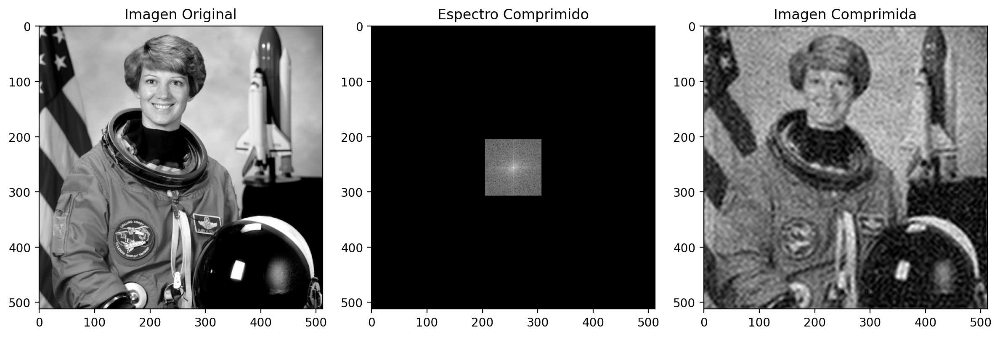

In [78]:
# Limitar el número de frecuencias (similar al filtrado)
def compress_image(F, keep_fraction):
    h, w = F.shape
    F_compressed = np.zeros_like(F)
    center_y, center_x = h // 2, w // 2
    # Rango para mantener una fracción de las frecuencias más bajas
    keep_h = int(h * keep_fraction // 2)
    keep_w = int(w * keep_fraction // 2)
    F_compressed[center_y - keep_h:center_y + keep_h, center_x - keep_w:center_x + keep_w] = F[center_y - keep_h:center_y + keep_h, center_x - keep_w:center_x + keep_w]
    return F_compressed

# Aplicar la compresión
keep_fraction = 0.2
F_compressed = compress_image(F_noisy_shifted, keep_fraction)

# Transformada inversa para obtener la imagen comprimida
F_compressed_shifted = ifftshift(F_compressed)
image_compressed = np.abs(ifft2(F_compressed_shifted))

# Mostrar la imagen original, el espectro y la imagen comprimida
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title("Imagen Original")

plt.subplot(1, 3, 2)
plt.imshow(np.log(1 + np.abs(F_compressed)), cmap='gray')
plt.title("Espectro Comprimido")

plt.subplot(1, 3, 3)
plt.imshow(image_compressed, cmap='gray')
plt.title("Imagen Comprimida")

plt.tight_layout()
plt.show()